# Introduction

We will conduct an investigation into whether pitch types can be better predicted with unsupervised clustering methods or K-nearest neighbours.

To begin, we will import the necessary libraries to acquire, store and plot data.

* pybaseball - used to retrieve data from baseball statistical websites
* pandas - used to store the data acquired by pybaseball
* matplotlib - used to plot data

In [1]:
import pybaseball as pb
import pandas as pd
import matplotlib.pyplot as plt

In [5]:
pd.options.display.max_rows = 20
pd.options.display.max_columns = 20

# Obtaining pitch data

pybaseball will allow us to obtain the data for every pitch thrown by a given pitcher between two dates. We can only go back as far as 2006, as this is when pitch tracking was introduced.

In [3]:
cole = pb.statcast_pitcher('2019-01-01', '2020-01-01', 543037)

Gathering Player Data


We will begin by obtaining every pitch thrown by Gerrit Cole in 2019.

In [6]:
cole

,pitch_type,game_date,release_speed,release_pos_x,release_pos_z,player_name,batter,pitcher,events,description,...,fld_score,post_away_score,post_home_score,post_bat_score,post_fld_score,if_fielding_alignment,of_fielding_alignment,spin_axis,delta_home_win_exp,delta_run_exp
0,FF,2019-10-27,98.2,-1.85,5.62,"Cole, Gerrit",645302,543037,strikeout,called_strike,...,4,4,1,1,4,Standard,Standard,214.0,-0.024,-0.258
1,FF,2019-10-27,99.8,-2.11,5.61,"Cole, Gerrit",645302,543037,NaN,ball,...,4,4,1,1,4,Standard,Standard,216.0,0.000,0.066
2,FF,2019-10-27,98.4,-1.90,5.72,"Cole, Gerrit",645302,543037,NaN,called_strike,...,4,4,1,1,4,Standard,Standard,214.0,0.000,-0.080
3,FF,2019-10-27,98.0,-1.76,5.76,"Cole, Gerrit",645302,543037,NaN,ball,...,4,4,1,1,4,Standard,Standard,212.0,0.000,0.037
4,FF,2019-10-27,97.5,-2.10,5.60,"Cole, Gerrit",645302,543037,NaN,swinging_strike,...,4,4,1,1,4,Standard,Standard,212.0,0.000,-0.045
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
4014,NaN,2019-03-03,NaN,NaN,NaN,"Cole, Gerrit",607208,543037,NaN,ball,...,2,2,0,0,2,NaN,NaN,NaN,0.000,NaN
4015,NaN,2019-03-03,NaN,NaN,NaN,"Cole, Gerrit",607208,543037,NaN,ball,...,2,2,0,0,2,NaN,NaN,NaN,0.000,NaN
4016,NaN,2019-02-26,NaN,NaN,NaN,"Cole, Gerrit",516770,543037,field_out,hit_into_play,...,0,0,0,0,0,NaN,NaN,NaN,-0.010,NaN
4017,NaN,2019-02-26,NaN,NaN,NaN,"Cole, Gerrit",500743,543037,field_out,hit_into_play,...,0,0,0,0,0,NaN,NaN,NaN,-0.016,NaN


We can see comprehensive information for every pitch, however, some do not have any data, presumably because they were thrown in spring training. To ensure these samples do not interfere with any models we create, we must remove them from the dataset.

In [7]:
cole = cole[cole['plate_x'].notnull() & cole['plate_z'].notnull() & cole['pitch_type'].notnull() & cole['release_speed'].notnull() & cole['release_spin_rate'].notnull() & cole['pfx_z'].notnull() & cole['spin_axis'].notnull() & cole['delta_home_win_exp'].notnull() & cole['delta_run_exp'].notnull()]


We will remove any series without plate coordinate, pitch type and win expectancy information by using notnull.

In [8]:
cole

,pitch_type,game_date,release_speed,release_pos_x,release_pos_z,player_name,batter,pitcher,events,description,...,fld_score,post_away_score,post_home_score,post_bat_score,post_fld_score,if_fielding_alignment,of_fielding_alignment,spin_axis,delta_home_win_exp,delta_run_exp
0,FF,2019-10-27,98.2,-1.85,5.62,"Cole, Gerrit",645302,543037,strikeout,called_strike,...,4,4,1,1,4,Standard,Standard,214.0,-0.024,-0.258
2,FF,2019-10-27,98.4,-1.90,5.72,"Cole, Gerrit",645302,543037,NaN,called_strike,...,4,4,1,1,4,Standard,Standard,214.0,0.000,-0.080
3,FF,2019-10-27,98.0,-1.76,5.76,"Cole, Gerrit",645302,543037,NaN,ball,...,4,4,1,1,4,Standard,Standard,212.0,0.000,0.037
4,FF,2019-10-27,97.5,-2.10,5.60,"Cole, Gerrit",645302,543037,NaN,swinging_strike,...,4,4,1,1,4,Standard,Standard,212.0,0.000,-0.045
5,SL,2019-10-27,90.8,-2.01,5.69,"Cole, Gerrit",645302,543037,NaN,ball,...,4,4,1,1,4,Standard,Standard,126.0,0.000,0.034
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
3908,SL,2019-03-29,89.8,-2.35,5.95,"Cole, Gerrit",640457,543037,NaN,foul,...,0,0,0,0,0,Infield shift,Standard,158.0,0.000,0.000
3909,FF,2019-03-29,96.3,-2.16,5.89,"Cole, Gerrit",640457,543037,NaN,foul,...,0,0,0,0,0,Infield shift,Standard,209.0,0.000,-0.073
3910,SL,2019-03-29,88.5,-2.34,5.96,"Cole, Gerrit",640457,543037,NaN,ball,...,0,0,0,0,0,Infield shift,Standard,174.0,0.000,0.054
3911,SI,2019-03-29,96.7,-2.34,5.77,"Cole, Gerrit",640457,543037,NaN,ball,...,0,0,0,0,0,Infield shift,Standard,225.0,0.000,0.027


# Plotting pitch data

### 2D plotting

To plot pitch data, we will need to label our pitches with integers. This is because we want to colour-code pitches so that we can find relationships between different statistics.

In [9]:
pitches = ['AB','AS','CH','CU','EP','FC','FF','FO','FS','FT','GY','IN','KC','KN','NP','PO','SC','SI','SL','UN']
pitchToNum = {p:i for i,p in enumerate(pitches)}
numToPitch = {i:p for i,p in enumerate(pitches)}
del pitches

In [12]:
print(pitchToNum,'\n\n',numToPitch)

{'AB': 0, 'AS': 1, 'CH': 2, 'CU': 3, 'EP': 4, 'FC': 5, 'FF': 6, 'FO': 7, 'FS': 8, 'FT': 9, 'GY': 10, 'IN': 11, 'KC': 12, 'KN': 13, 'NP': 14, 'PO': 15, 'SC': 16, 'SI': 17, 'SL': 18, 'UN': 19} 

 {0: 'AB', 1: 'AS', 2: 'CH', 3: 'CU', 4: 'EP', 5: 'FC', 6: 'FF', 7: 'FO', 8: 'FS', 9: 'FT', 10: 'GY', 11: 'IN', 12: 'KC', 13: 'KN', 14: 'NP', 15: 'PO', 16: 'SC', 17: 'SI', 18: 'SL', 19: 'UN'}


The list pitches was taken from https://www.daktronics.com/en-us/support/kb/DD3312647, which shows the different pitches captured by PITCHf/x and statcast. By creating two dictionaries, we can translate pitch types to number labels that can be fed into matplotlib.

In [16]:
def mapPitches(column):
    return [pitchToNum[p] for p in column.to_numpy()]

mapPitches will take a list of pitch types and assign them a number from the pitchToNum dictionary. This will be used as helper function for the plotting function.

In [18]:
def createPlot(dataframe,x,y,mapping='pitch_type'):
    pX = dataframe[x].to_numpy()
    pY = dataframe[y].to_numpy()
    pMapping = mapPitches(dataframe[mapping])
    
    plt.scatter(pX, pY, c = pMapping, cmap = 'nipy_spectral')
    plt.xlabel(x)
    plt.ylabel(y)
    plt.title(f'{x} against {y}')
    
    plt.show()
        

createPlot takes a statistics dataframe and three variables for the axis and the field used for mapping (currently pitch_type). Each axis is taken from the dataframe, whilst the labels are generated with the mapPitches function. The data is then plotted with nipy colourmapping, which provided the greatest differentiation between pitch types.

We don't need every value for a pitch to create a model; some of them are irrelevant when determining a pitch type, such as context-based and result-based information. Therefore, we are hoping to find the best statistics to use that can define a particular pitch (A particular pitch signature), as this will lead to greater prediction accuracy.

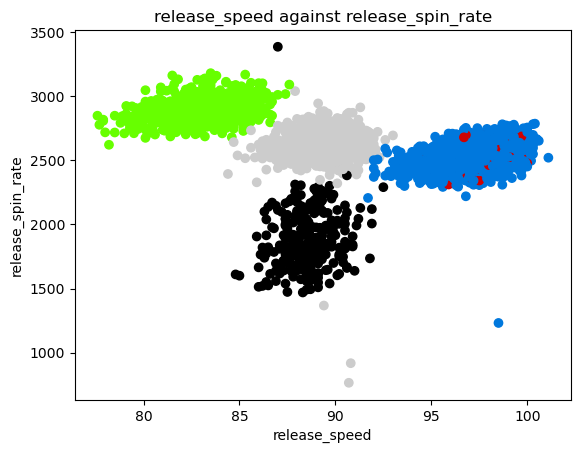

In [19]:
createPlot(cole,'release_speed','release_spin_rate')

This plot shows speed plotted against spin rate. We can see clusters but red and blue are merged together, so a prediction based classification method may not be able to predict red.

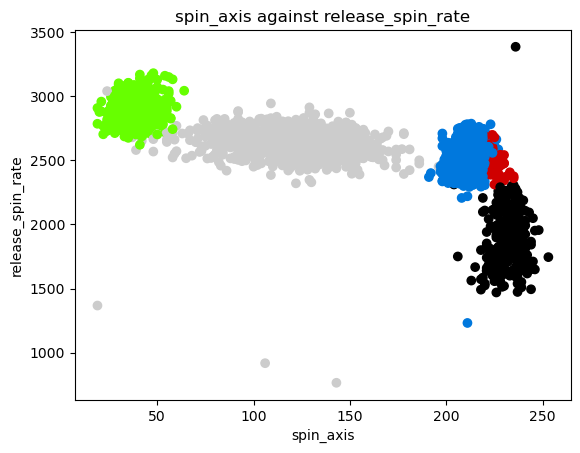

In [20]:
createPlot(cole,'spin_axis','release_spin_rate')

By plotting spin rate against spin axis, we can begin to see a separation between all pitch types.

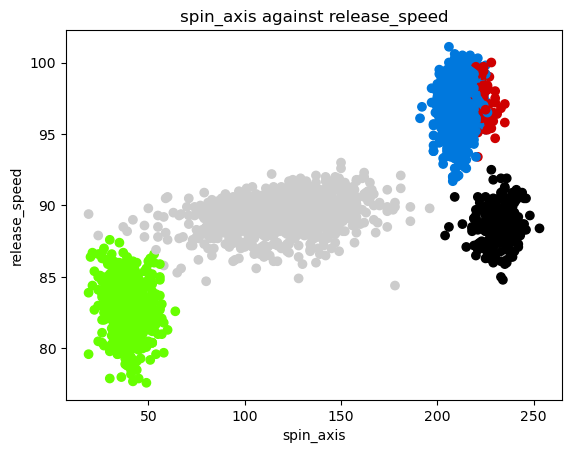

In [21]:
createPlot(cole,'spin_axis','release_speed')

Plotting spin axis against release speed also shows a clear separation between pitch types, however red and blue are in the same cluster.

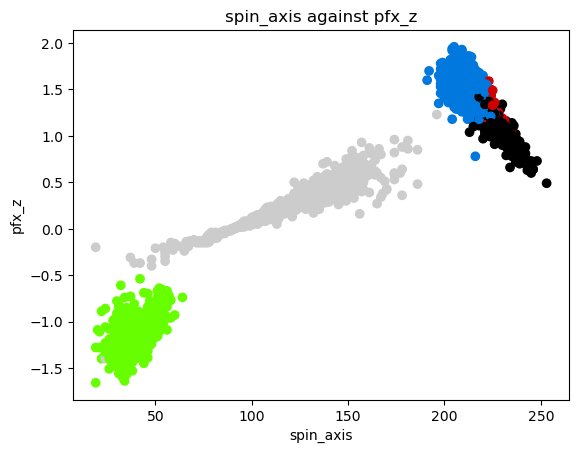

In [22]:
createPlot(cole,'spin_axis','pfx_z')

Plotting spin axis against vertical break only shows 3 clusters.

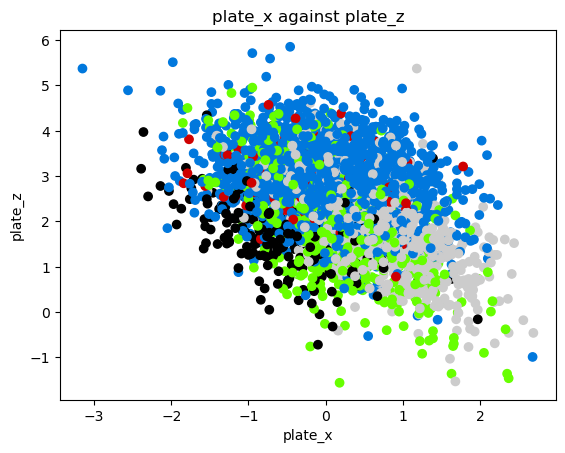

In [23]:
 createPlot(cole,'plate_x','plate_z')

Plotting the pitch location as it crosses the plate shows no clear pattern between pitches, so we should consider using a 3D plot to better visualise the data.

### 3D plotting

In [25]:
def createPlot3d(dataframe,x,y,z,mapping='pitch_type'):
    pX, pY, pZ, pMapping = dataframe[x].to_numpy(), dataframe[y].to_numpy(), dataframe[z].to_numpy(), mapPitches(dataframe[mapping])
    fig = plt.figure()
    ax = fig.add_subplot(projection = '3d')
    ax.scatter(pX, pY, pZ, c = pMapping, cmap = 'nipy_spectral')
    plt.title(f'{x} against {y} against {z}')
    fig.set_size_inches(12, 12)
    plt.show()

This function works similarly to the 2D version of createPlot but takes 3 axis arguments.

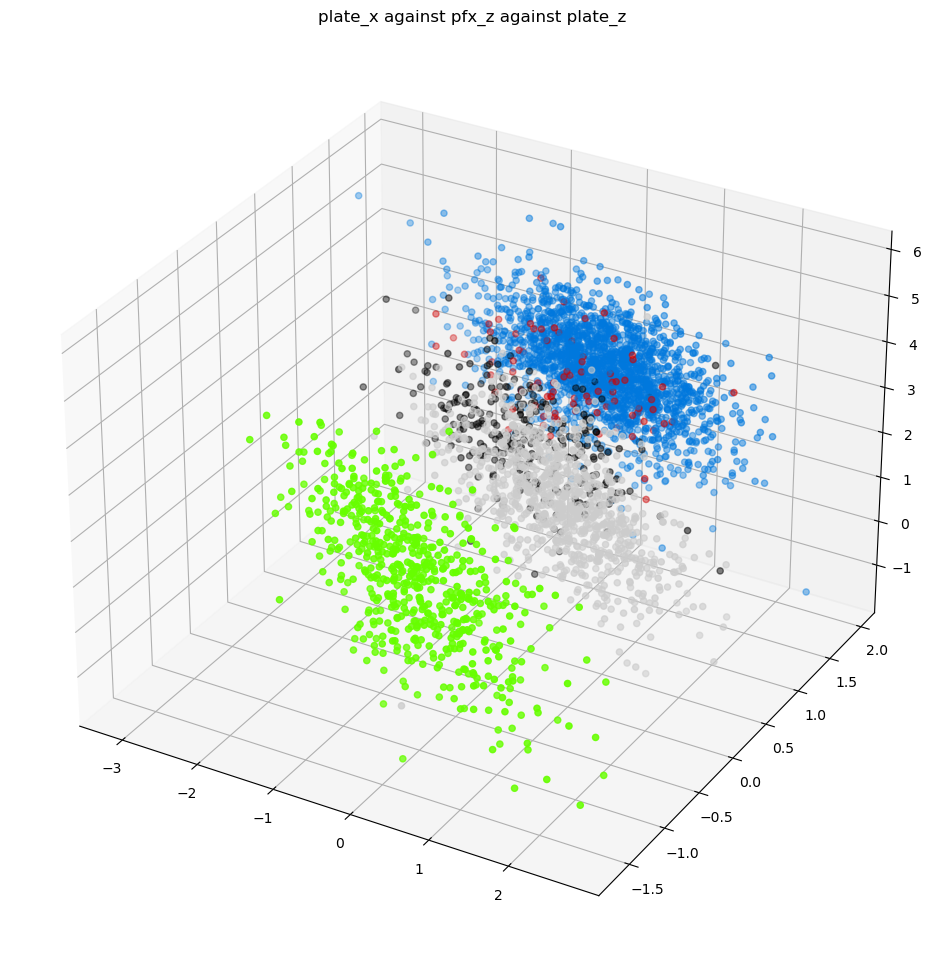

In [26]:
createPlot3d(cole,'plate_x','pfx_z','plate_z')

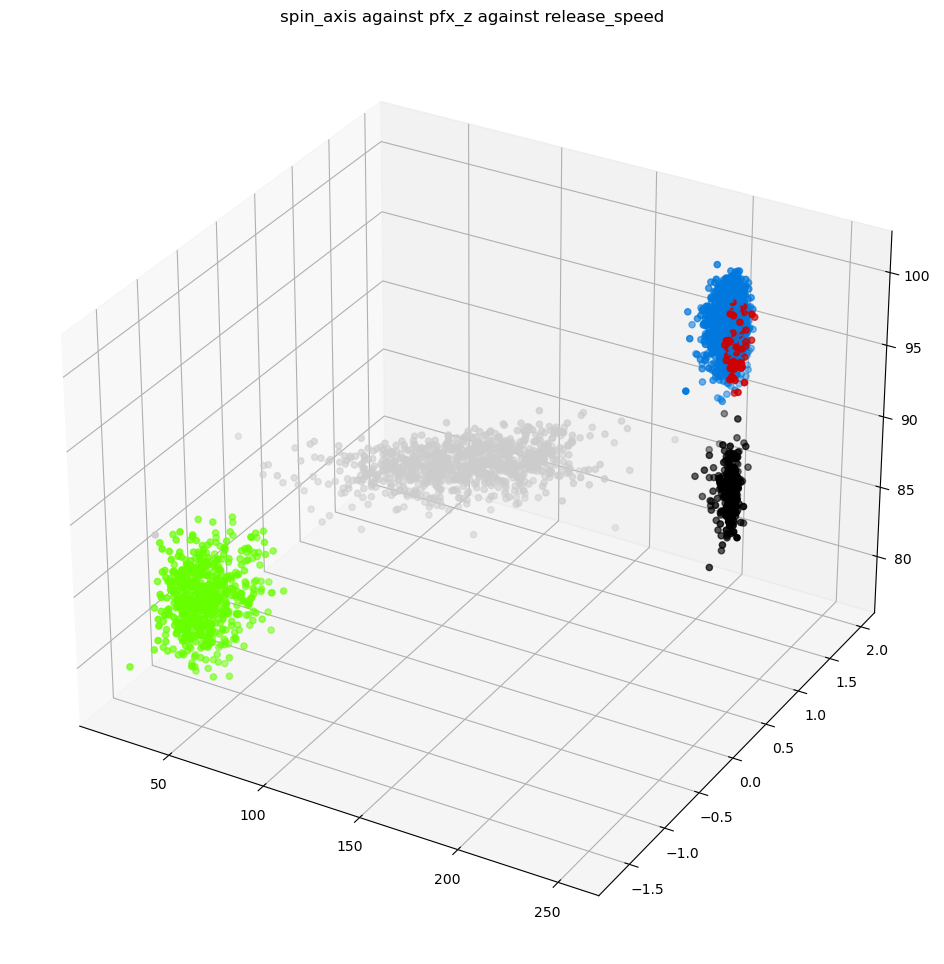

In [27]:
createPlot3d(cole,'spin_axis','pfx_z','release_speed')

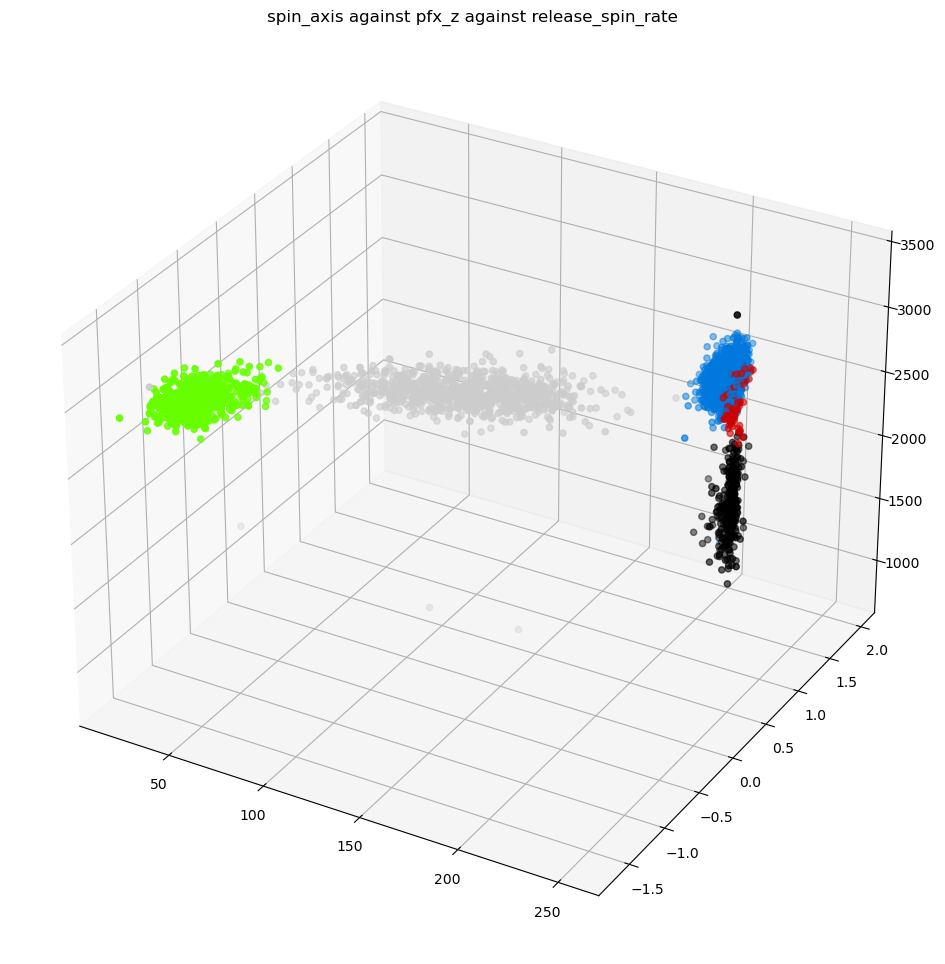

In [28]:
createPlot3d(cole,'spin_axis','pfx_z','release_spin_rate')

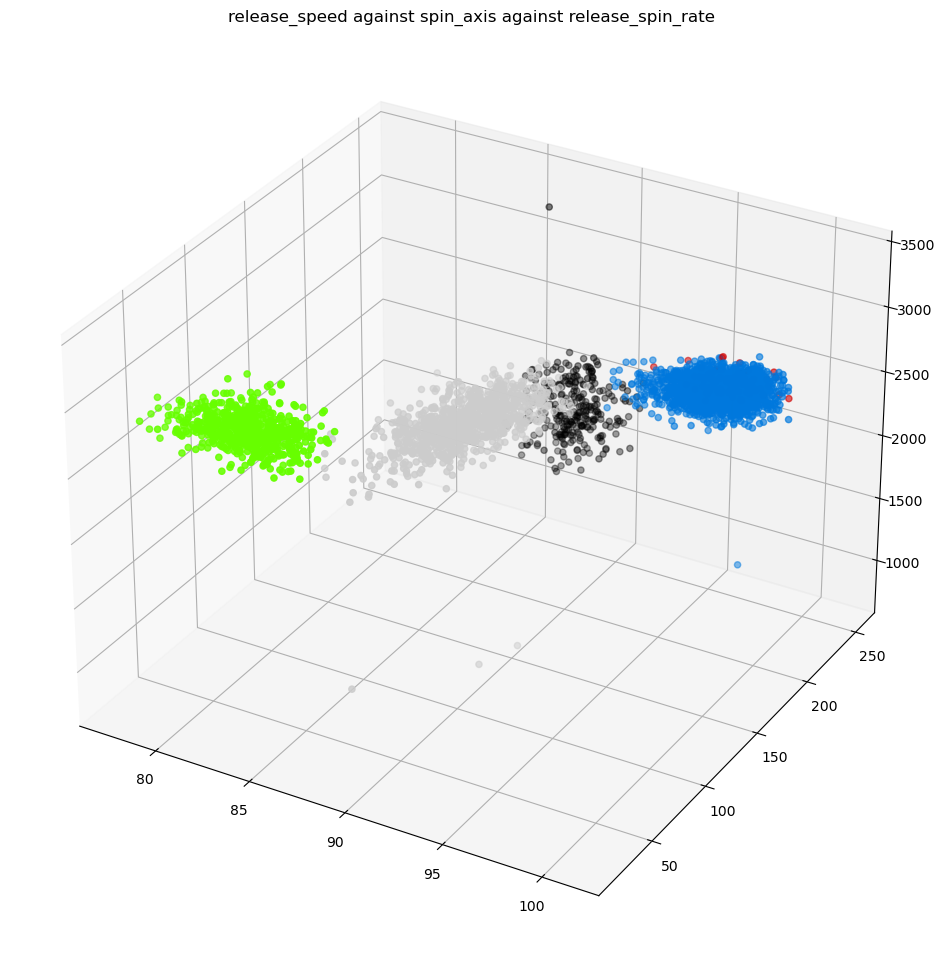

In [30]:
createPlot3d(cole,'release_speed','spin_axis','release_spin_rate')

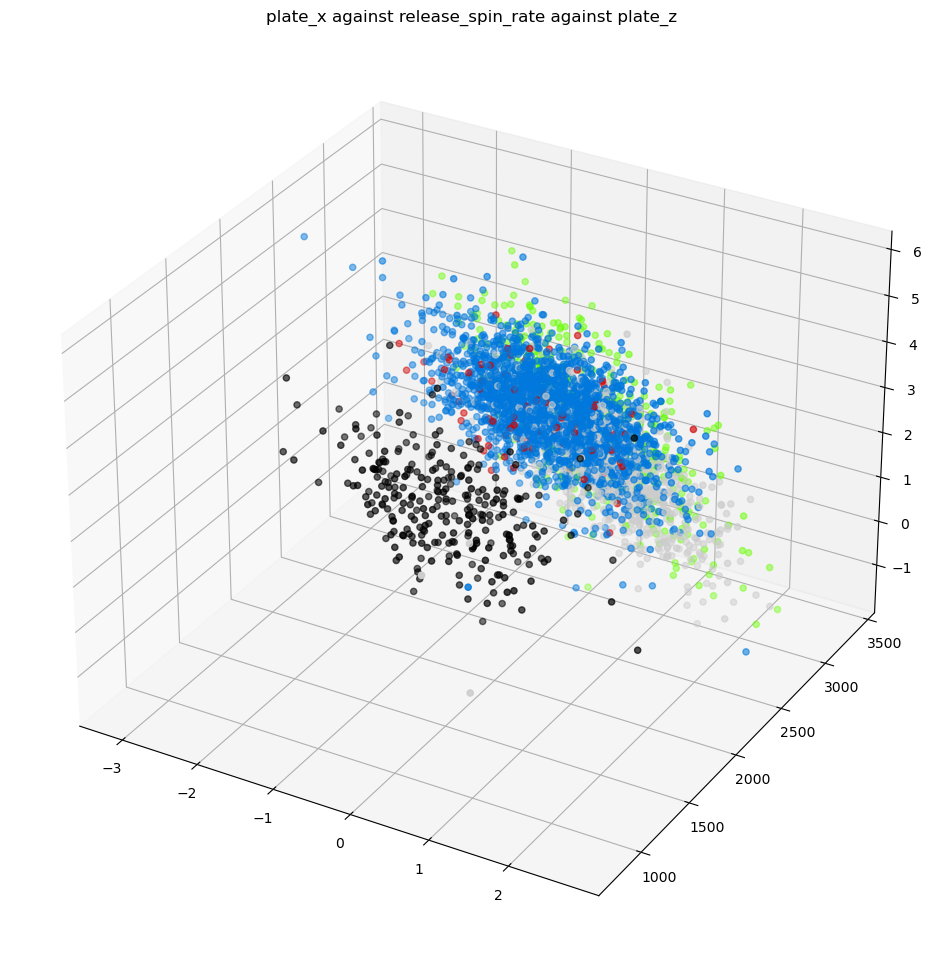

In [34]:
createPlot3d(cole,'plate_x','release_spin_rate','plate_z')

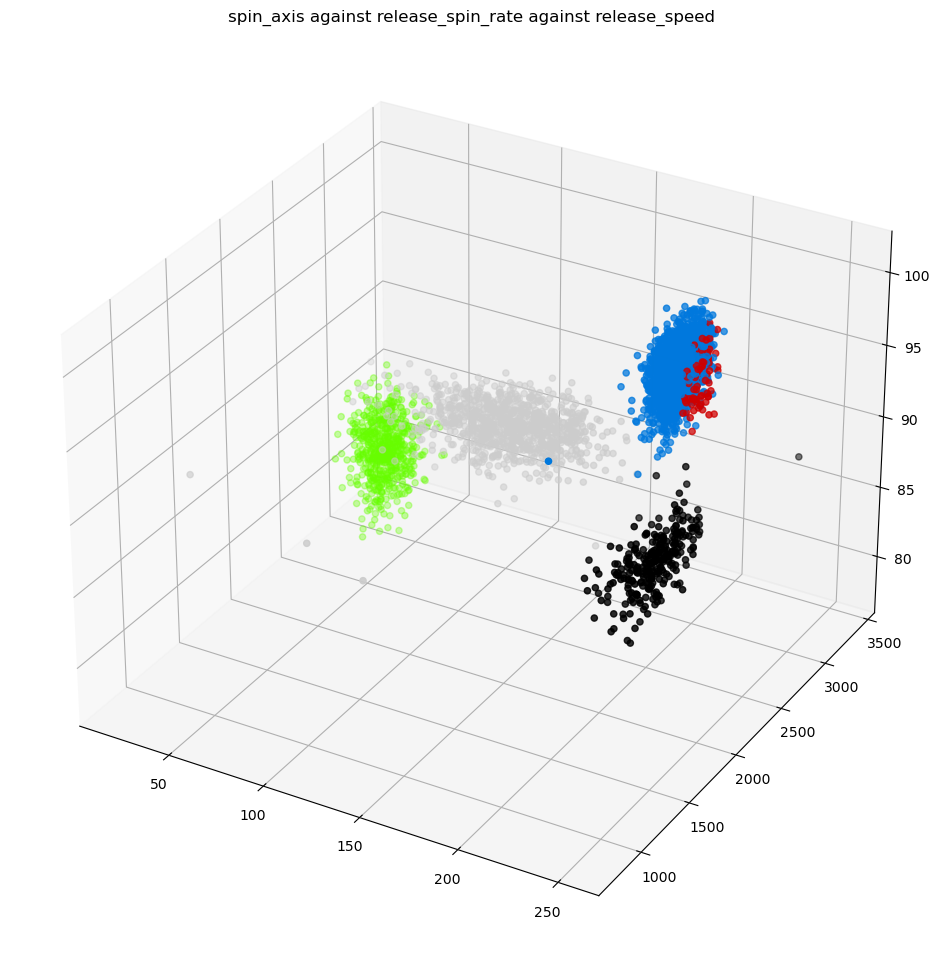

In [35]:
createPlot3d(cole,'spin_axis','release_spin_rate','release_speed')

### Investigating Darvish dataset

Gerrit Cole only used 5 pitches in 2019, so we can see how multiple pitches look like when plotted, we can explore the pitch data of Yu Darvish. Darvish uses multiple pitches, so we can investigate how different types of pitches appear.

In [36]:
from datetime import date

We can create a general function to import pitcher data and sanitise it; we start by importing datetime to help us with dates.

In [38]:
def getPitcherData(pitcherId,year = date.today().year):
    if isinstance(year,list) and len(year) == 2:
        startYear, endYear = year
        endYear += 1
    else:
        startYear = year
        endYear = year + 1
        
    dataframe = pb.statcast_pitcher(f'{startYear}-01-01', f'{endYear}-01-01', pitcherId)
    dataframe = dataframe[dataframe['plate_x'].notnull() & dataframe['plate_z'].notnull() & dataframe['pitch_type'].notnull() & dataframe['release_speed'].notnull() & dataframe['release_spin_rate'].notnull() & dataframe['pfx_z'].notnull() & dataframe['spin_axis'].notnull() & dataframe['delta_home_win_exp'].notnull() & dataframe['delta_run_exp'].notnull()]

    return dataframe

getPitcherData takes an ID and either a single value or tuple representing a year range - not passing through year leads to the current year being assumed. The request is made to the module; the result is sanitised and returned to the main program.

In [39]:
darvish = getPitcherData(506433,[2018,2022])

Gathering Player Data


In [40]:
darvish

,pitch_type,game_date,release_speed,release_pos_x,release_pos_z,player_name,batter,pitcher,events,description,...,fld_score,post_away_score,post_home_score,post_bat_score,post_fld_score,if_fielding_alignment,of_fielding_alignment,spin_axis,delta_home_win_exp,delta_run_exp
0,ST,2022-10-23,81.5,-2.10,5.73,"Darvish, Yu",681082,506433,double,hit_into_play,...,3,3,2,2,3,Strategic,Standard,51.0,0.134,0.556
1,SL,2022-10-23,84.7,-2.09,5.70,"Darvish, Yu",681082,506433,NaN,called_strike,...,3,3,2,2,3,Standard,Standard,107.0,0.000,-0.076
2,SL,2022-10-23,84.8,-2.05,5.77,"Darvish, Yu",681082,506433,NaN,ball,...,3,3,2,2,3,Standard,Standard,114.0,0.000,0.114
3,ST,2022-10-23,80.3,-2.12,5.73,"Darvish, Yu",681082,506433,NaN,ball,...,3,3,2,2,3,Standard,Standard,44.0,0.000,0.049
4,ST,2022-10-23,79.7,-2.30,5.61,"Darvish, Yu",681082,506433,NaN,called_strike,...,3,3,2,2,3,Standard,Standard,61.0,0.000,-0.043
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
11341,ST,2018-03-31,82.3,-2.56,5.56,"Darvish, Yu",518618,506433,NaN,ball,...,0,0,0,0,0,Standard,Standard,102.0,0.000,0.059
11342,FF,2018-03-31,95.2,-2.56,5.53,"Darvish, Yu",621446,506433,hit_by_pitch,hit_by_pitch,...,0,0,0,0,0,Standard,Standard,196.0,0.036,0.414
11344,SI,2018-03-31,94.1,-2.43,5.62,"Darvish, Yu",621446,506433,NaN,swinging_strike,...,0,0,0,0,0,Standard,Standard,251.0,0.000,-0.056
11345,FF,2018-03-31,93.8,-2.49,5.61,"Darvish, Yu",621446,506433,NaN,foul,...,0,0,0,0,0,Standard,Standard,200.0,0.000,-0.044


I decided to use the last 5 seasons of Yu Darvish's career to evaluate how using large sample sizes will affect the data. After sanitising the dataframe (removing Spring Training data), the sample size is 10598.

In [41]:
createPlot(darvish,'spin_axis','release_spin_rate')

KeyError: 'ST'

The createPlot function won't work because the pitch type 'ST' is not in the dictionary.

In [42]:
pitchSet = set(darvish['pitch_type'].to_numpy())

In [43]:
pitchSet

{'CH', 'CS', 'CU', 'FC', 'FF', 'FS', 'KC', 'SI', 'SL', 'ST'}

In [23]:
def createPitchMappings(column):
    pitches = column.to_numpy()
    pitchDict = {p:i for i,p in enumerate(set(pitches))}
    return [pitchDict[p] for p in pitches]

The list of pitches we obtained before is incomplete, so this function aims to solve this by create a unique mapping for every dataset due to be plotted.

In [24]:
def createPlot(dataframe,x,y,mapping='pitch_type'):
    pX = dataframe[x].to_numpy()
    pY = dataframe[y].to_numpy()
    pMapping = createPitchMappings(dataframe[mapping])
    
    plt.scatter(pX, pY, c = pMapping, cmap = 'nipy_spectral')
    plt.xlabel(x)
    plt.ylabel(y)
    plt.title(f'{x} against {y}')
    
    plt.show()

We will also modify createPlot to allow us to use the same function calls.

### Plotting the Darvish dataset

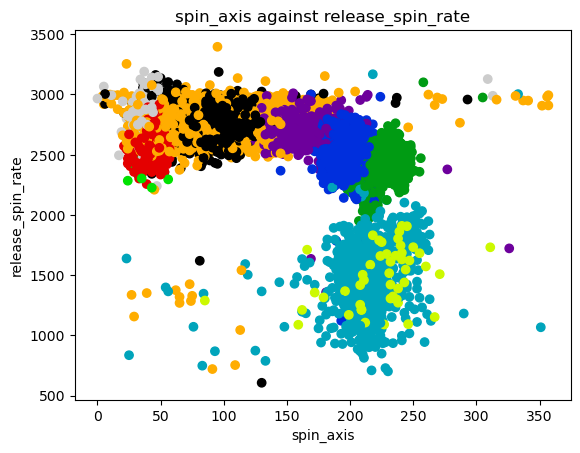

In [46]:
createPlot(darvish,'spin_axis','release_spin_rate')

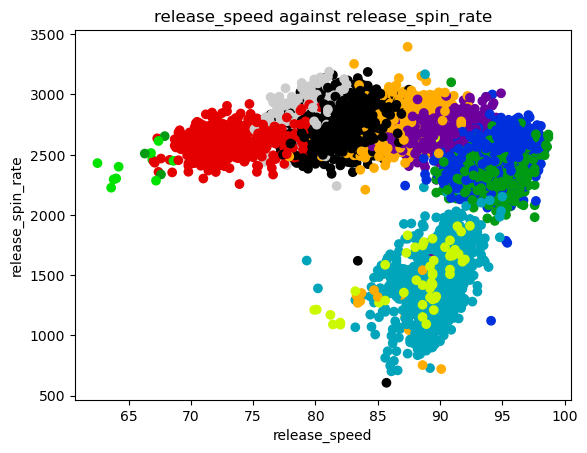

In [47]:
createPlot(darvish,'release_speed','release_spin_rate')

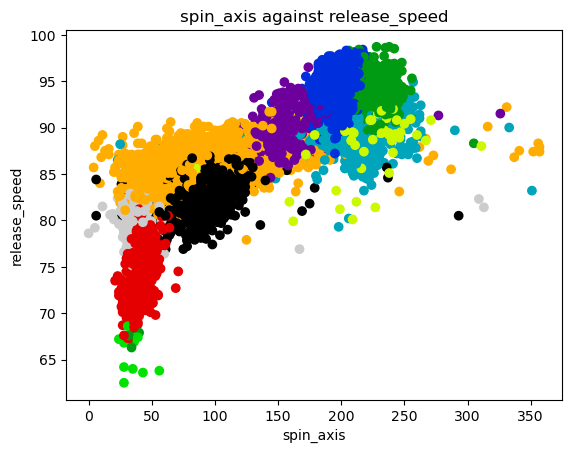

In [51]:
createPlot(darvish,'spin_axis','release_speed')

The combination of more pitches, both in volume and by type, means that there are less defined clusters in the Darvish dataset compared to the Cole dataset, which may make it harder to predict pitches or define them. This may be because Yu Darvish uses many different similar pitches that are close enough to each other by spin axis and release speed, which leads to less defined boundaries.

In [48]:
def createPlot3d(dataframe,x,y,z,mapping='pitch_type'):
    pX, pY, pZ = dataframe[x].to_numpy(), dataframe[y].to_numpy(), dataframe[z].to_numpy()
    pMapping = createPitchMappings(dataframe[mapping])
    fig = plt.figure()
    ax = fig.add_subplot(projection = '3d')
    ax.scatter(pX, pY, pZ, c = pMapping, cmap = 'nipy_spectral')
    plt.title(f'{x} against {y} against {z}')
    fig.set_size_inches(12, 12)
    plt.show()

We will also modify createPlot3d to allow us to plot in 3d using the new method.

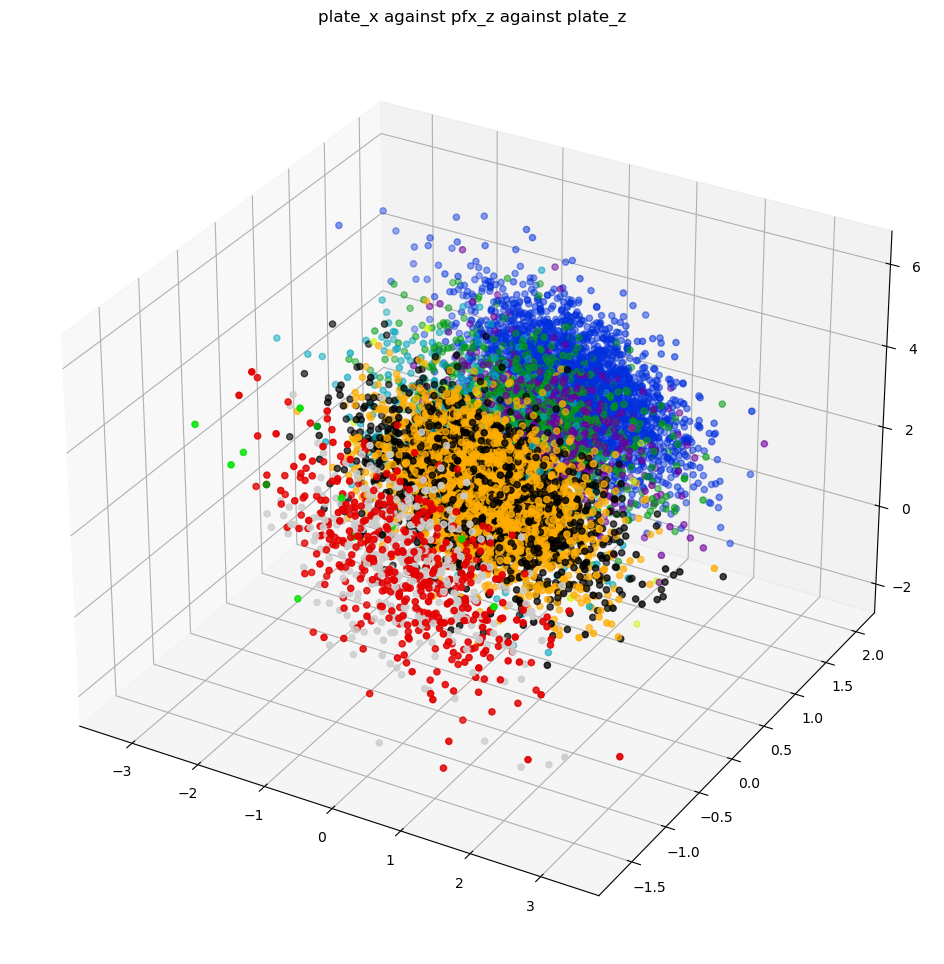

In [49]:
createPlot3d(darvish,'plate_x','pfx_z','plate_z')

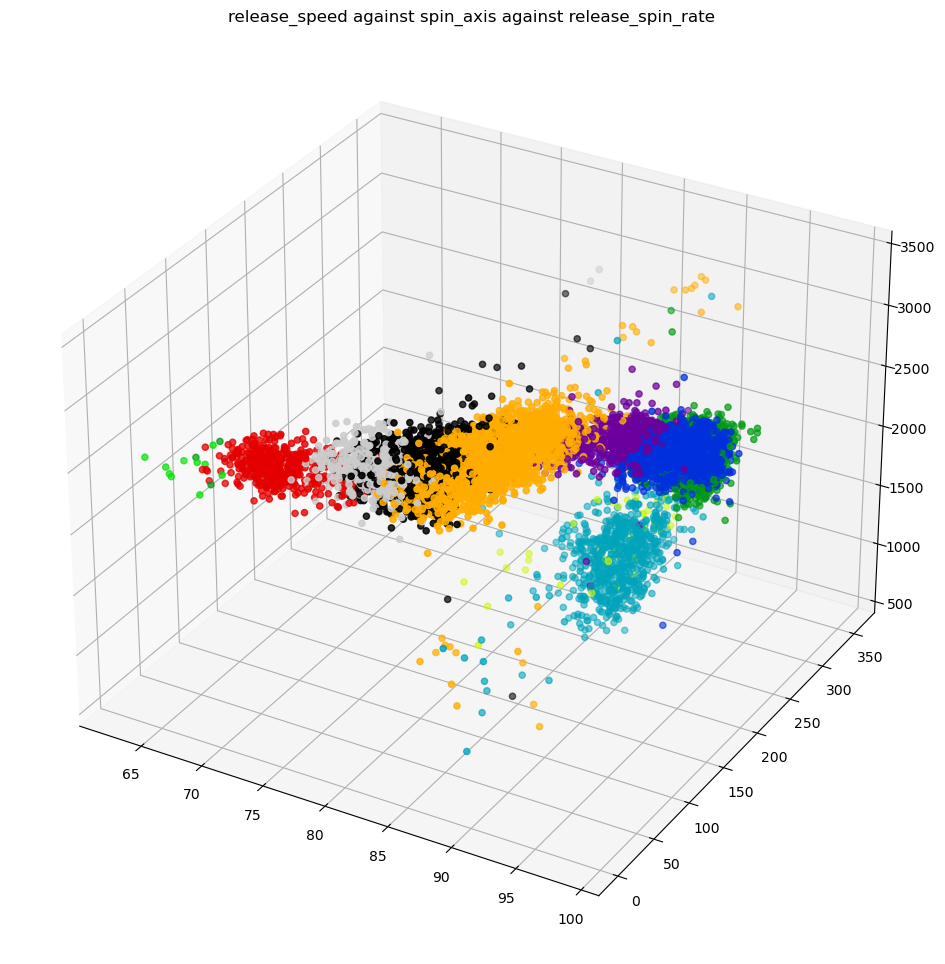

In [50]:
createPlot3d(darvish,'release_speed','spin_axis','release_spin_rate')

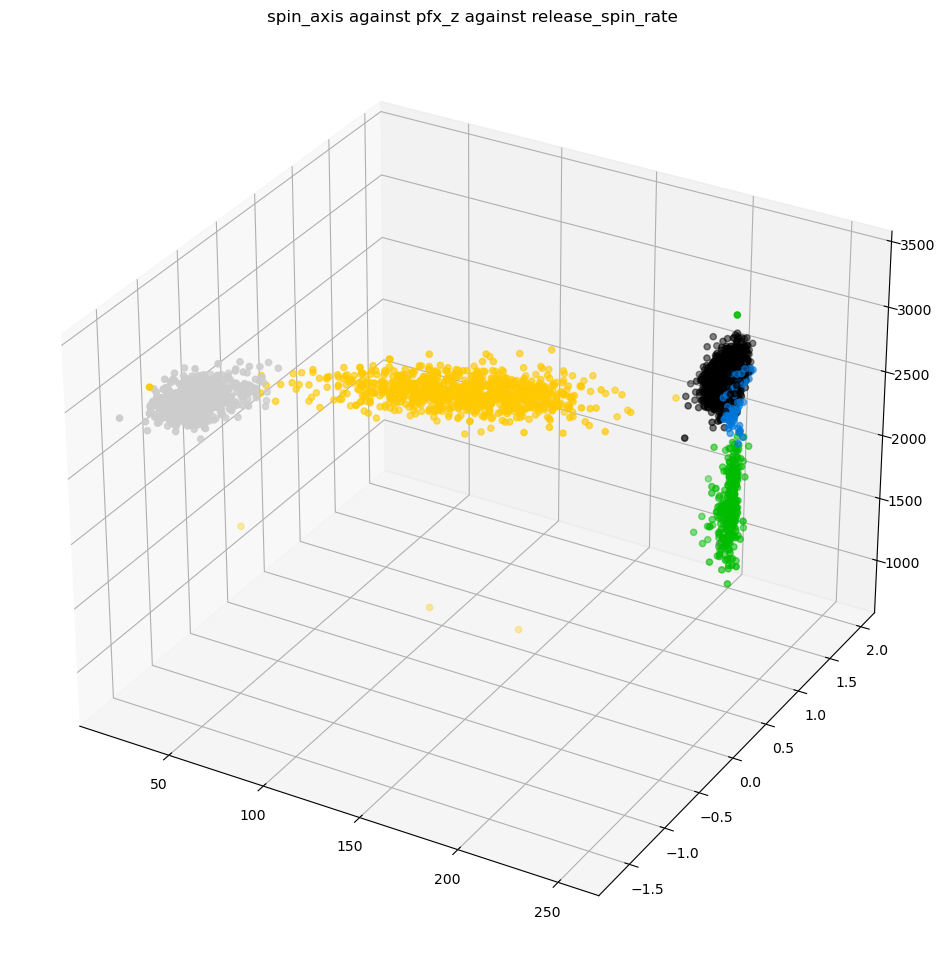

In [52]:
createPlot3d(cole,'spin_axis','pfx_z','release_spin_rate')

# Creating prediction models

In [53]:
import numpy as np
from sklearn.model_selection import train_test_split
from sklearn import metrics

* numpy - will allow us to manipulate arrays for using in predictions
* sklearn.model_selection - provides methods like train_test_split that allow us to easily create training and testing datasets
* sklearn.metrics - provides methods that allow us to evaluate the performance of models

In [54]:
def getData(dataframe,parameters,target,split):
    X,y = dataframe[parameters],dataframe[target]
    trainX, testX, trainY, testYAct = train_test_split(X,y,test_size = (split if split < 1 else (1/split)))
     
    return trainX, testX, trainY, testYAct

This function will take a dataframe and split it into training and testing sets based on a list of features and a target.

In [78]:
def plotConfusionMatrix(actual,predicted):
    cMatrix = metrics.confusion_matrix(actual,predicted)
    cMDisplay = metrics.ConfusionMatrixDisplay(confusion_matrix=cMatrix)
    cMDisplay.plot()
    plt.show()
    
def getMetrics(actual,predicted):
    accuracy = metrics.accuracy_score(actual, predicted) * 100
    
    print(f'ACCURACY - {accuracy}% of samples accurately predicted')

These functions will allow us to create a confusion matrix to see how well our model can predict data and to see the overall accuracy.

In [57]:
from sklearn import neighbors
from sklearn import cluster

* sklearn.neighbors - allows us to use k-Nearest Neighbours
* sklearn.cluster - allows us to use unsupervised clustering methods

In [58]:
darvishTrainX, darvishTestX, darvishTrainY, darvishTestYAct = getData(darvish,['release_speed','spin_axis','release_spin_rate'],'pitch_type',0.25)


In [79]:
def printMetrics(actual,predicted):
    plotConfusionMatrix(actual,predicted)
    getMetrics(actual,predicted)

## DB Scan

DB Scan (Density-Based Spatial Clustering of Applications with Noise) is used to detect clusters in a dataset by finding areas of low density between areas of high density. It is more general than k-means, so clusters can be any size.

Clusters are composed of core samples (samples in high density areas that belong to a cluster) and outliers (lone samples within a given distance of a core sample). By adjusting eps (epsilon distance), we can determine how close samples have to be to each other for them to be in the same cluster.

In [77]:
model1 = cluster.DBSCAN()
model1.fit(darvishTrainX,darvishTrainY)
darvishTestYPred = model1.fit_predict(darvishTestX)
print(set(darvishTestYPred))
printMetrics(darvishTestYAct,darvishTestYPred)

{-1}


ValueError: Mix of label input types (string and number)

This model wouldn't output a display matrix due to the data types used, however, this model was unable to create any clusters as it felt the samples were too noisy.

## Update - new DB Scan models

I decided to return to DB Scan to see if it was possible to generate models. The main factor preventing useful models from being generated was the epsilon distance, which I failed to adjust. The default value is 0.5, meaning the distance is too small, especially at the scales in the dataset, to link nearby samples together into a cluster.

In [6]:
import pybaseball as pb
import pandas as pd
import matplotlib.pyplot as plt
from sklearn import cluster
from sklearn import metrics
from datetime import date
from sklearn.model_selection import train_test_split

def getPitcherData(pitcherId,year = date.today().year):
    if isinstance(year,list) and len(year) == 2:
        startYear, endYear = year
        endYear += 1
    else:
        startYear = year
        endYear = year + 1
        
    dataframe = pb.statcast_pitcher(f'{startYear}-01-01', f'{endYear}-01-01', pitcherId)
    dataframe = dataframe[dataframe['plate_x'].notnull() & dataframe['plate_z'].notnull() & dataframe['pitch_type'].notnull() & dataframe['release_speed'].notnull() & dataframe['release_spin_rate'].notnull() & dataframe['pfx_z'].notnull() & dataframe['spin_axis'].notnull() & dataframe['delta_home_win_exp'].notnull() & dataframe['delta_run_exp'].notnull()]

    return dataframe

def getData(dataframe,parameters,target,split):
    X,y = dataframe[parameters],dataframe[target]
    trainX, testX, trainY, testYAct = train_test_split(X,y,test_size = (split if split < 1 else (1/split)))
     
    return trainX, testX, trainY, testYAct

darvish = getPitcherData(506433,[2018,2022])
dtrx, dtex, dtry, dteya = getData(darvish,['release_speed','spin_axis','release_spin_rate'],'pitch_type',0.25)

model1 = cluster.DBSCAN()
model1.fit(dtrx)
dteyp = model1.fit_predict(dtex)
print(set(dteyp))


Gathering Player Data
{-1}


Repeating the same parameters with the darvish dataset leads to the DB Scan algorithm deciding every sample is noisy.

Gathering Player Data
{0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, -1}


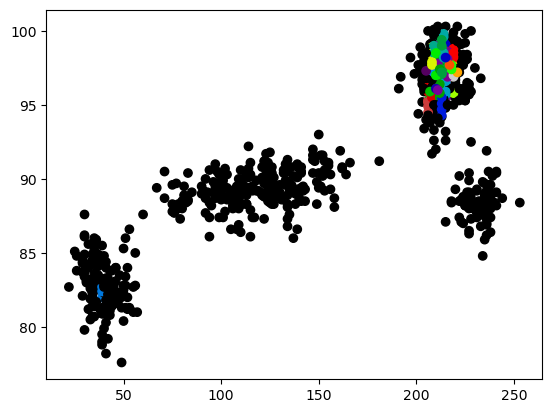

In [19]:
cole = getPitcherData(543037,2019)
ctrx, ctex, ctry, cteya = getData(cole,['spin_axis','pfx_z','release_speed'],'pitch_type',0.25)

model1 = cluster.DBSCAN()
model1.fit(ctrx)
cteyp = model1.fit_predict(ctex)
print(set(cteyp))

plt.scatter(ctex['spin_axis'],ctex['release_speed'],c=cteyp,cmap='nipy_spectral')
plt.show()

Using the cole dataset with default values creates many small clusters, as the epsilon distance is still too small.

{0, 1, 2, 3, -1}


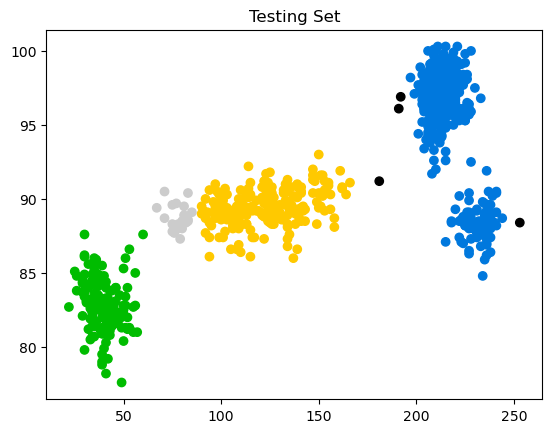

In [38]:
model1 = cluster.DBSCAN(eps=5.0)
model1.fit(ctrx)
cteyp = model1.fit_predict(ctex)
print(set(cteyp))

plt.scatter(ctex['spin_axis'],ctex['release_speed'],c=cteyp,cmap='nipy_spectral')
plt.title('Testing Set')
plt.show()

Using a epsilon value of 5 on the cole dataset leads to clusters being formed, however, two clusters have merged into one large blue cluster, whilst one cluster has been split into yellow and gray.

{0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, -1}


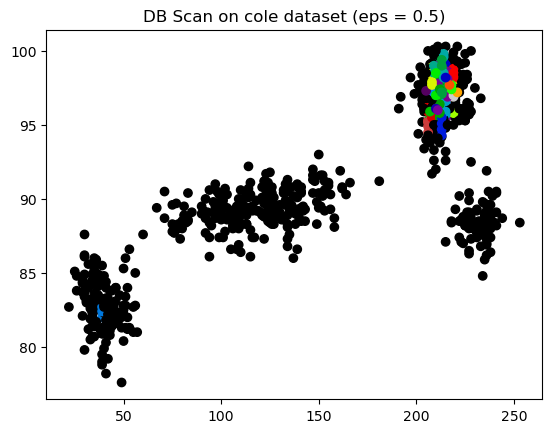

{0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, -1}


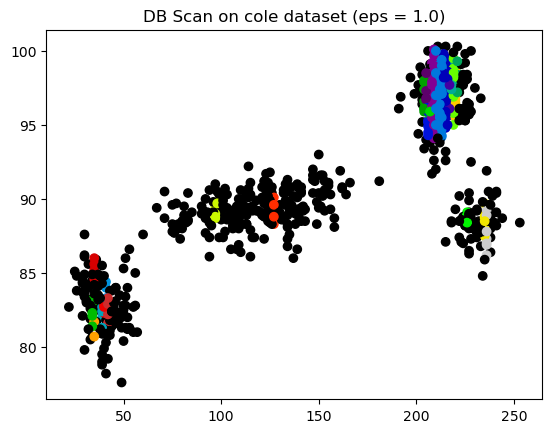

{0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, -1}


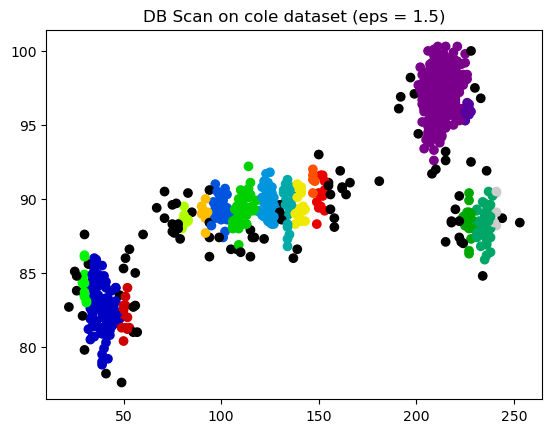

{0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, -1}


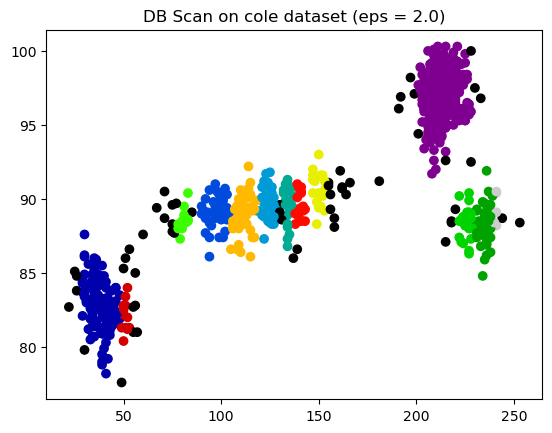

{0, 1, 2, 3, 4, 5, -1}


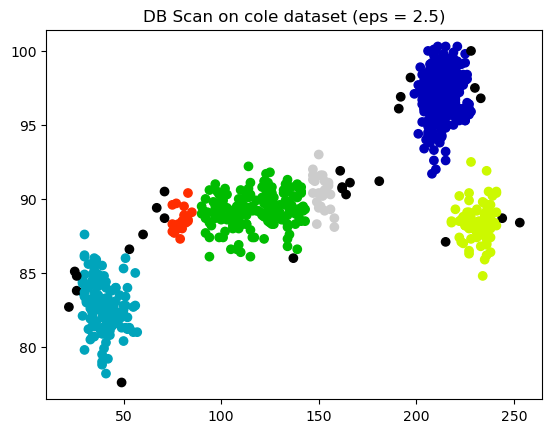

{0, 1, 2, 3, 4, 5, -1}


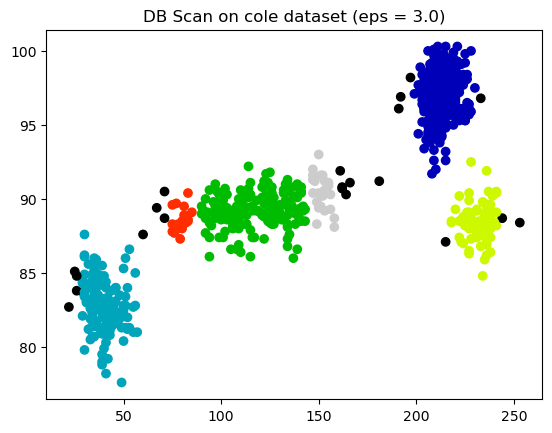

{0, 1, 2, 3, 4, 5, -1}


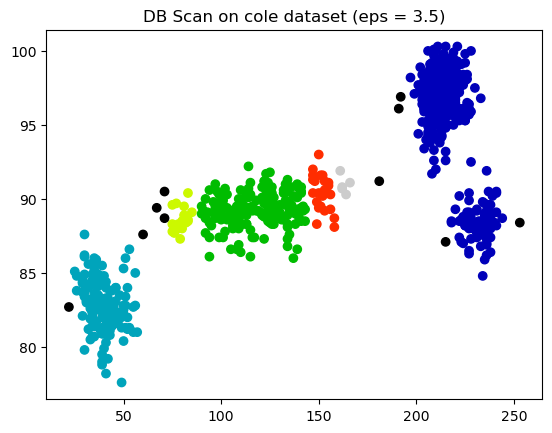

{0, 1, 2, 3, 4, 5, -1}


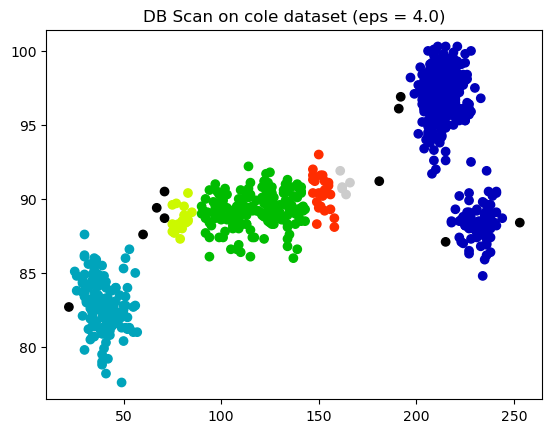

{0, 1, 2, 3, -1}


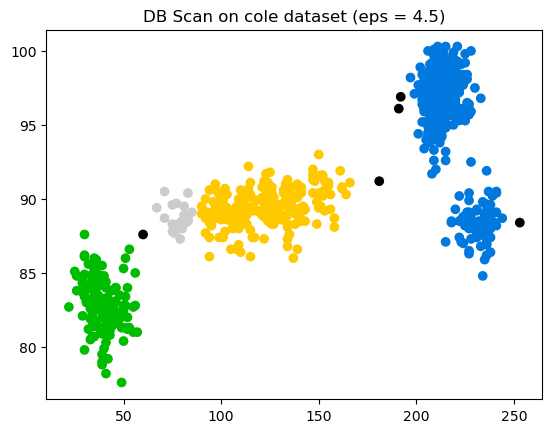

{0, 1, 2, 3, -1}


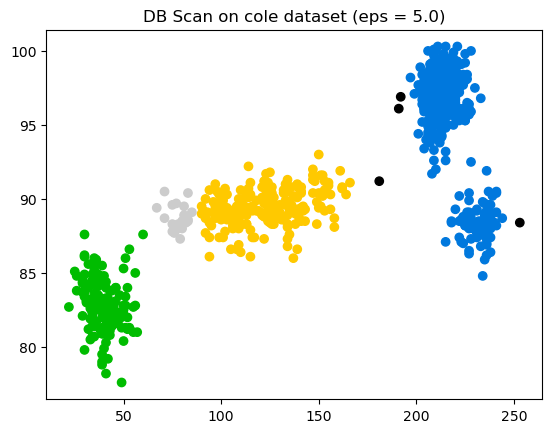

{0, 1, 2, -1}


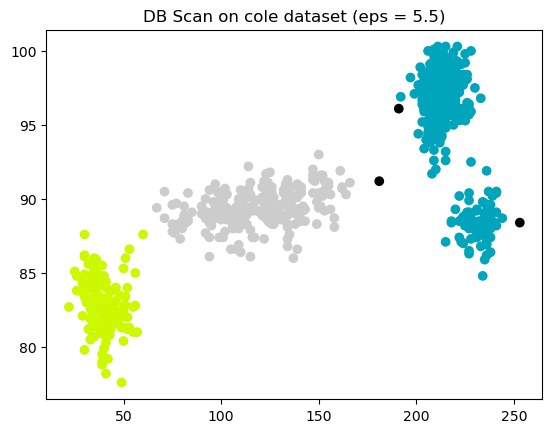

{0, 1, 2, -1}


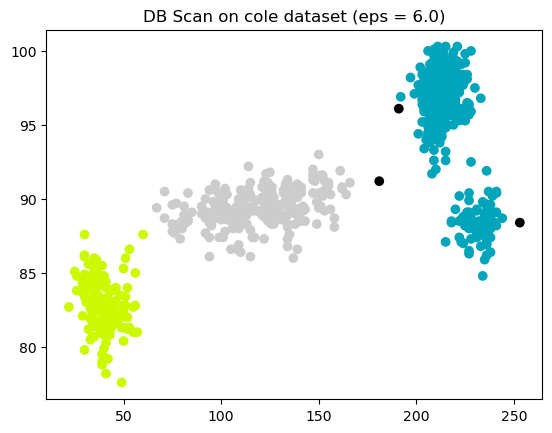

{0, 1, 2, -1}


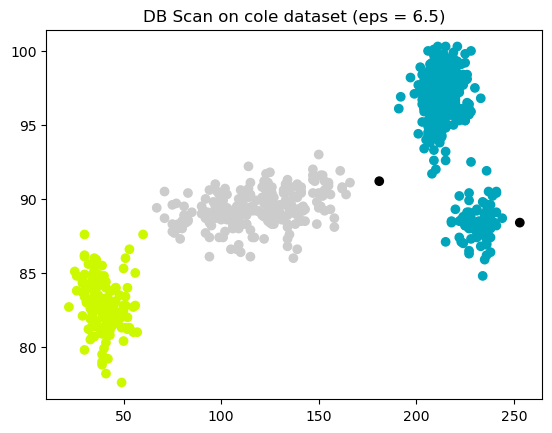

In [22]:
for i in range(5,70,5):
    val = i/10
    model1 = cluster.DBSCAN(eps=val)
    model1.fit(ctrx)
    cteyp = model1.fit_predict(ctex)
    print(set(cteyp))

    plt.scatter(ctex['spin_axis'],ctex['release_speed'],c=cteyp,cmap='nipy_spectral')
    plt.title(f'DB Scan on cole dataset (eps = {val})')
    plt.show()

By iterating through all epsilon values from 0.5 to 6.5, we can see the defined clusters forming and then merging. An epsilon value of 5.5 seems the most promising as it produces clean clusters with minimal outliers, however there are still 2 clusters that have merged.

To test if it may work better on other pitchers, I decided to use a dataset based on Justin Verlander's pitching data in the 2018 and 2019 seasons.

Gathering Player Data


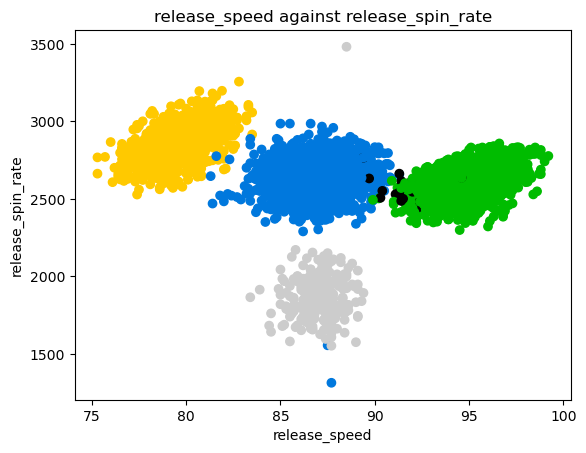

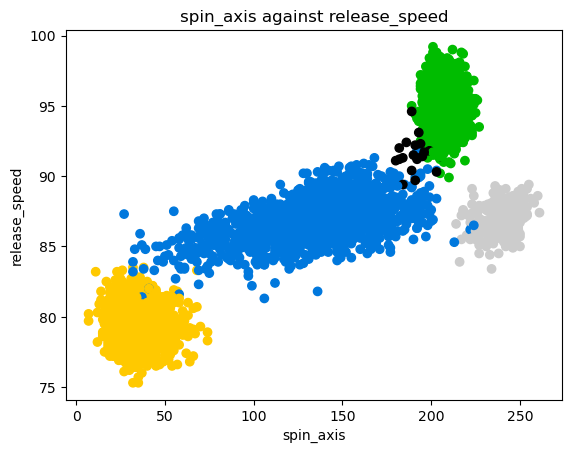

{0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, -1}


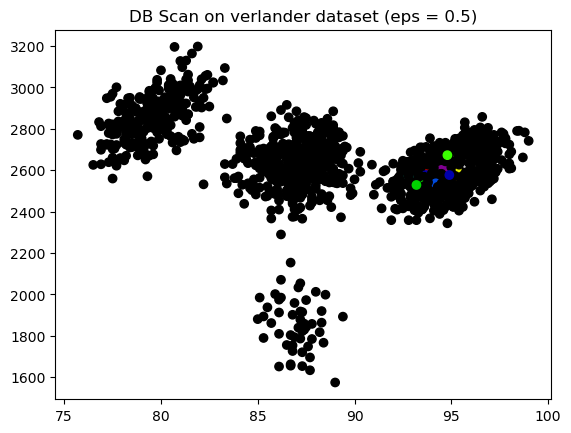

{0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, -1}


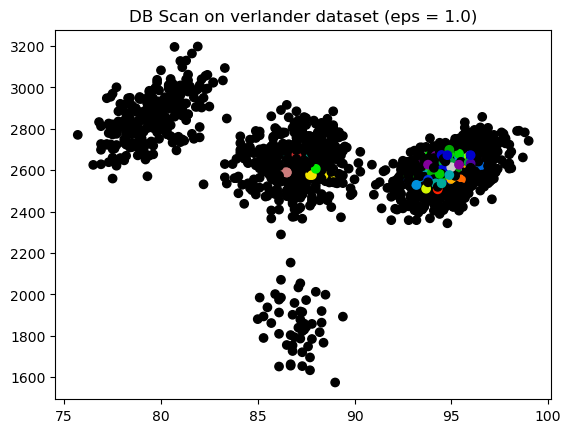

{0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, -1}


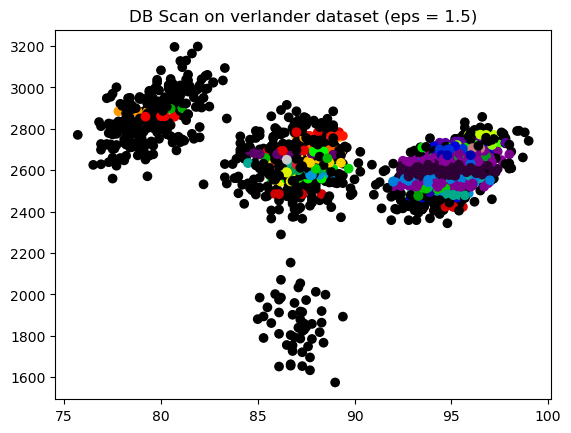

{0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, -1}


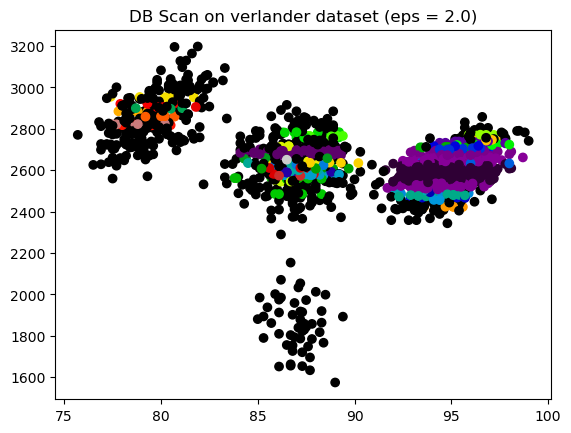

{0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, -1}


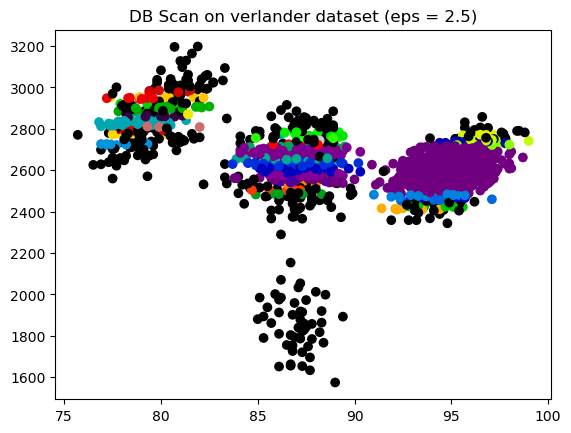

{0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, -1}


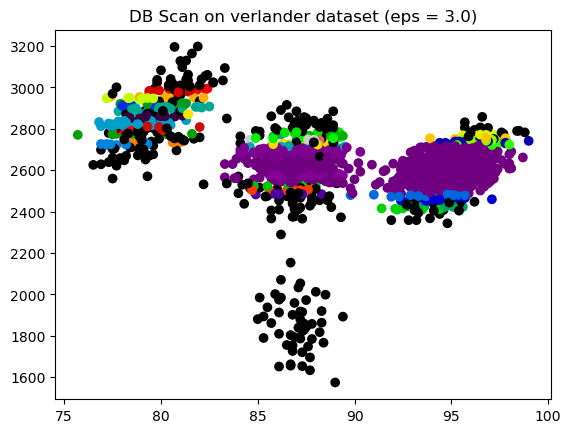

{0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, -1}


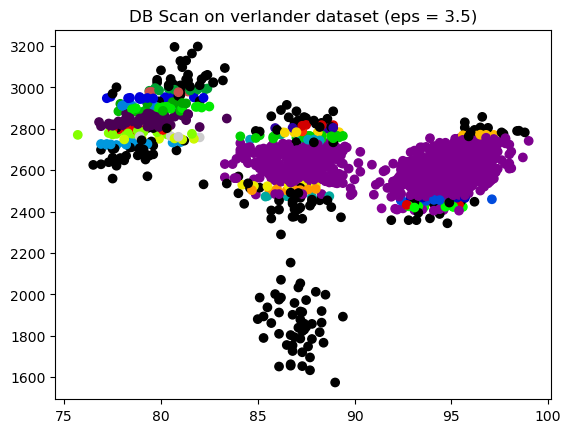

{0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, -1}


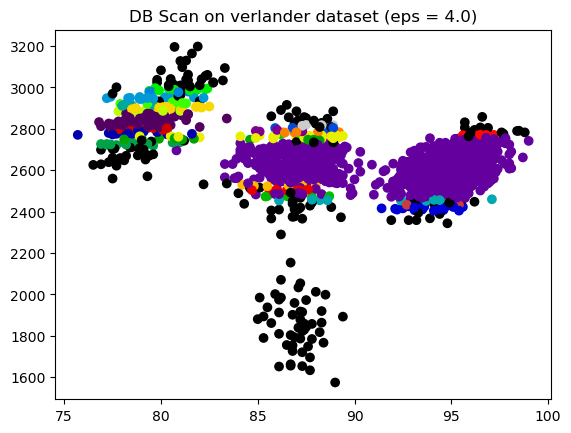

{0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, -1}


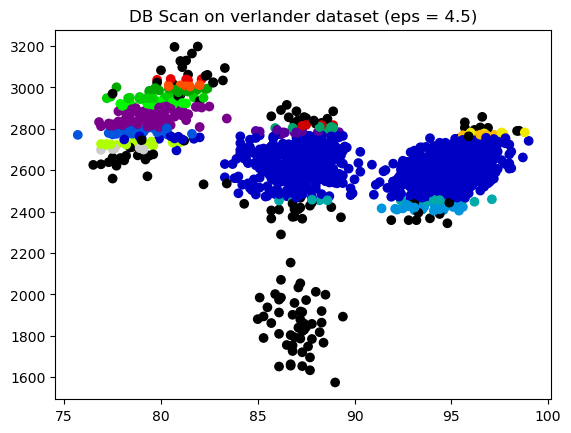

{0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, -1}


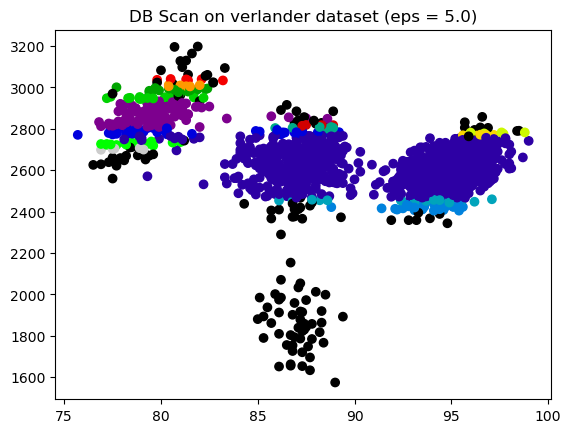

{0, 1, 2, 3, 4, 5, 6, 7, 8, 9, -1}


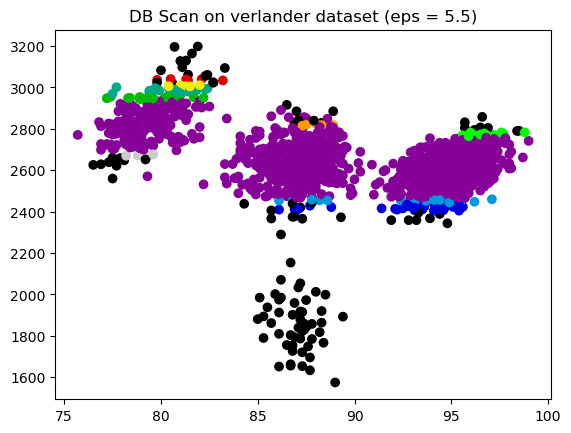

{0, 1, 2, 3, 4, 5, 6, 7, 8, -1}


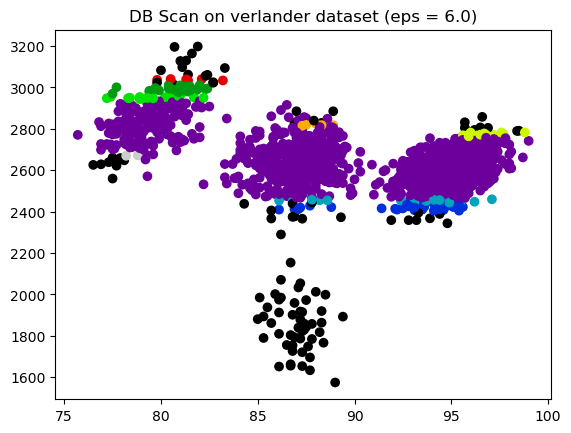

{0, 1, 2, 3, 4, -1}


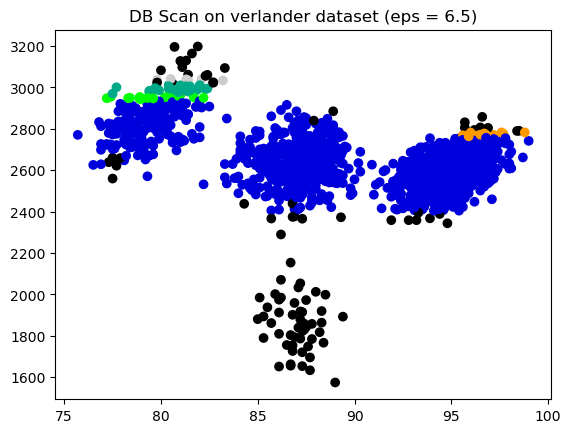

{0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 51, -1}


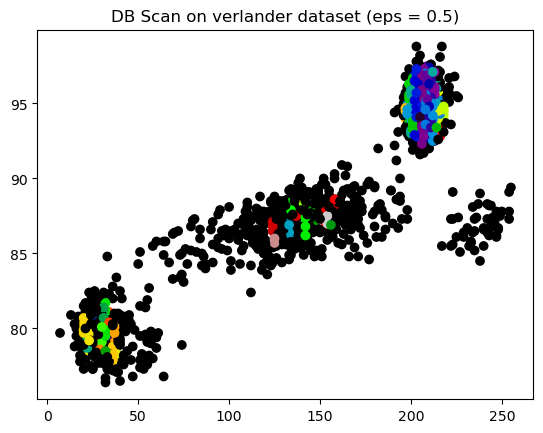

{0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, -1}


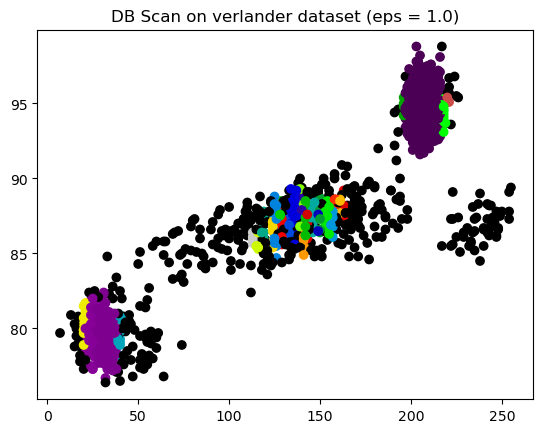

{0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, -1}


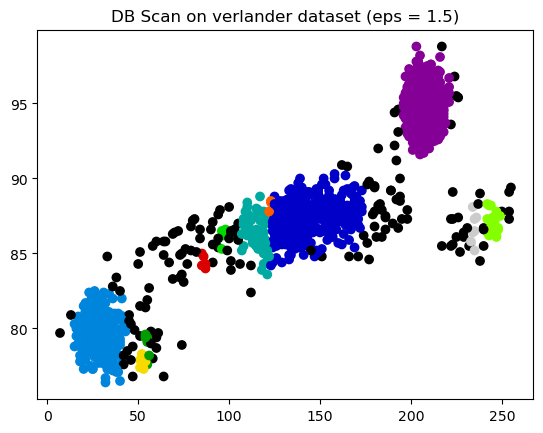

{0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, -1}


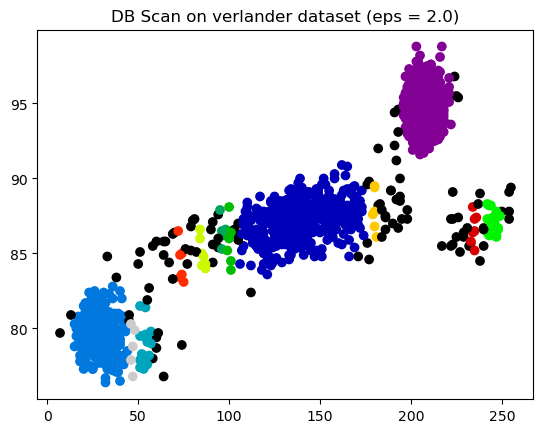

{0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, -1}


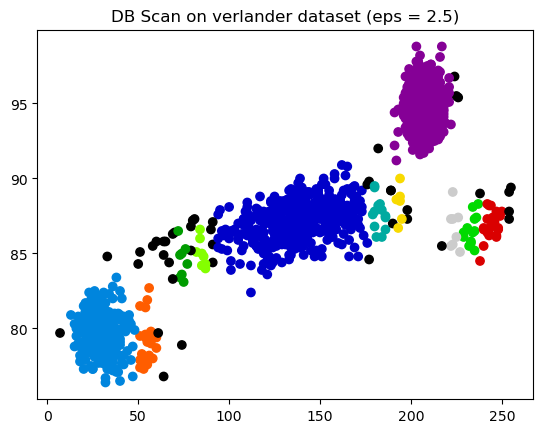

{0, 1, 2, 3, 4, 5, 6, 7, 8, 9, -1}


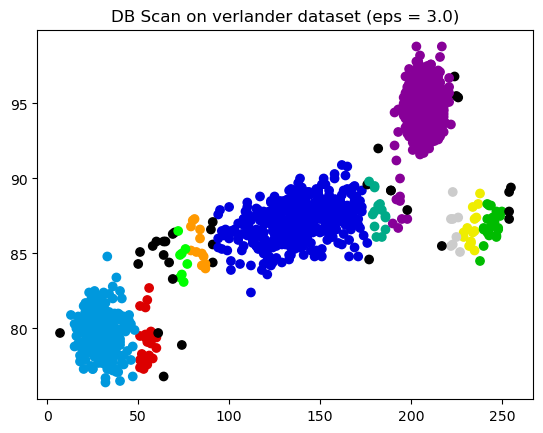

{0, 1, 2, 3, -1}


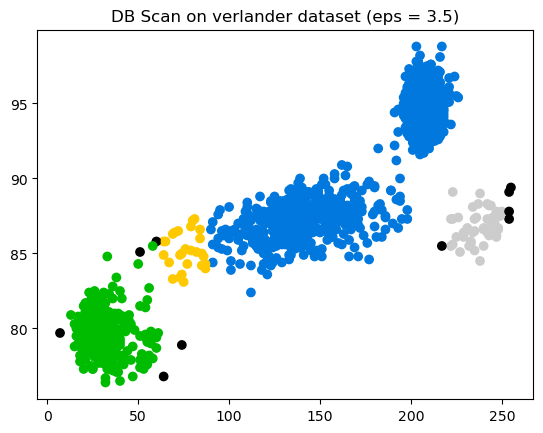

{0, 1, 2, -1}


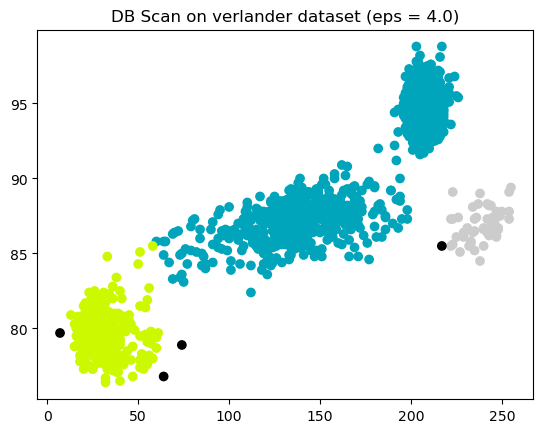

{0, 1, 2, -1}


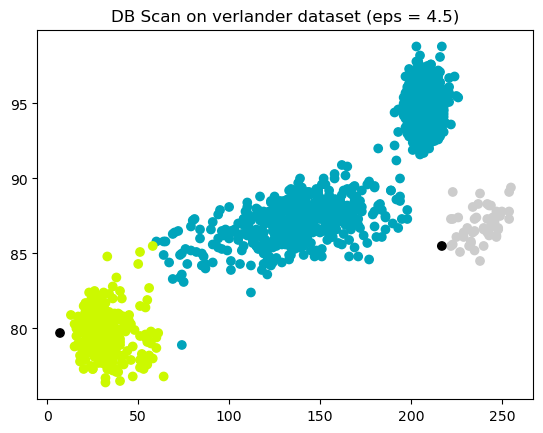

{0, 1, -1}


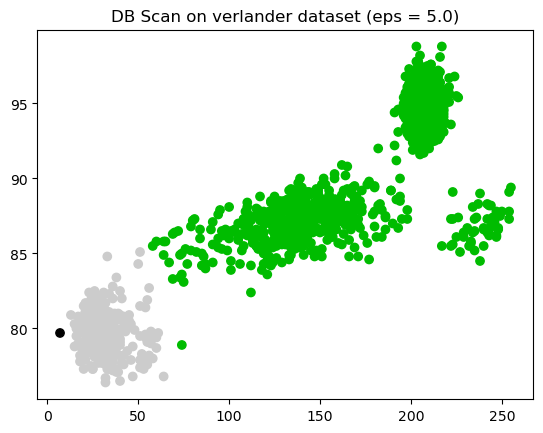

{0, -1}


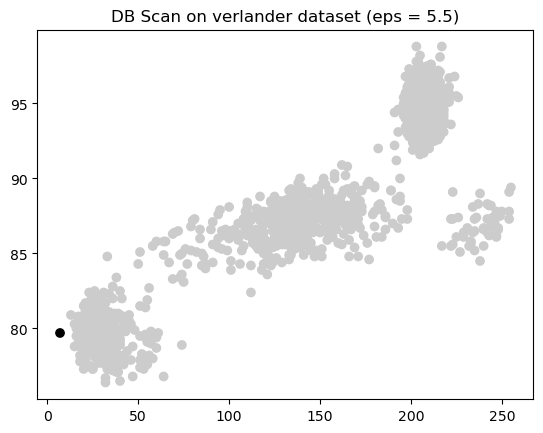

{0, -1}


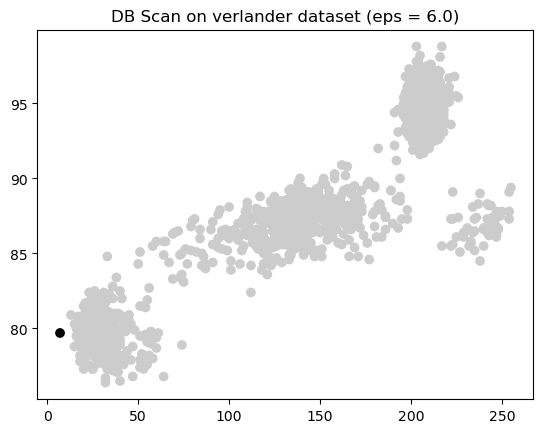

{0}


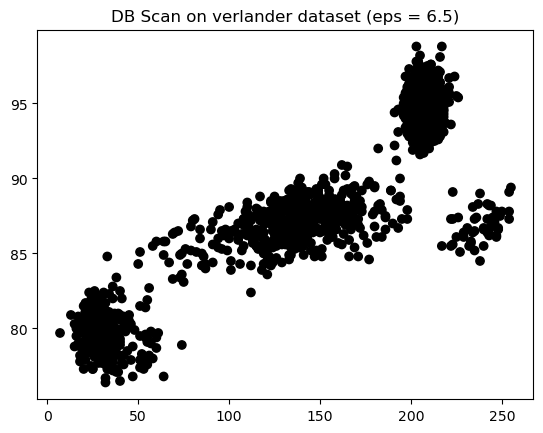

In [25]:
verlander = getPitcherData(434378,[2018,2019])
createPlot(verlander,'release_speed','release_spin_rate')
createPlot(verlander,'spin_axis','release_speed')

vtrx, vtex, vtry, vteya = getData(verlander,['release_speed','release_spin_rate'],'pitch_type',0.25)
for i in range(5,70,5):
    val = i/10
    model1 = cluster.DBSCAN(eps=val)
    model1.fit(vtrx)
    vteyp = model1.fit_predict(vtex)
    print(set(vteyp))

    plt.scatter(vtex['release_speed'],vtex['release_spin_rate'],c=vteyp,cmap='nipy_spectral')
    plt.title(f'DB Scan on verlander dataset (eps = {val})')
    plt.show()
    
vtrx, vtex, vtry, vteya = getData(verlander,['spin_axis','release_speed'],'pitch_type',0.25)
for i in range(5,70,5):
    val = i/10
    model1 = cluster.DBSCAN(eps=val)
    model1.fit(vtrx)
    vteyp = model1.fit_predict(vtex)
    print(set(vteyp))

    plt.scatter(vtex['spin_axis'],vtex['release_speed'],c=vteyp,cmap='nipy_spectral')
    plt.title(f'DB Scan on verlander dataset (eps = {val})')
    plt.show()


I decided to use DB Scan on the verlander dataset to investigate the efficacy of this method on creating clusters from speed against spin rate, as well as spin axis and release speed. The best performing model compared speed against spin axis with an epsilon value of 4, however, two of the clusters merged at a lower epsilon value.

In [32]:
verlander

,pitch_type,game_date,release_speed,release_pos_x,release_pos_z,player_name,batter,pitcher,events,description,...,fld_score,post_away_score,post_home_score,post_bat_score,post_fld_score,if_fielding_alignment,of_fielding_alignment,spin_axis,delta_home_win_exp,delta_run_exp
0,SL,2019-10-29,89.8,-1.49,6.97,"Verlander, Justin",435062,434378,field_out,hit_into_play,...,2,3,2,3,2,Standard,Standard,181.0,0.011,-0.099
1,SL,2019-10-29,88.9,-1.66,6.99,"Verlander, Justin",435062,434378,NaN,swinging_strike,...,2,3,2,3,2,Standard,Standard,196.0,0.000,-0.033
2,SL,2019-10-29,89.8,-1.66,6.92,"Verlander, Justin",435062,434378,NaN,ball,...,2,3,2,3,2,Standard,Standard,178.0,0.000,0.024
3,SL,2019-10-29,89.3,-1.57,7.03,"Verlander, Justin",435062,434378,NaN,foul,...,2,3,2,3,2,Standard,Strategic,199.0,0.000,-0.021
4,SL,2019-10-29,89.4,-1.56,6.91,"Verlander, Justin",435062,434378,NaN,ball,...,2,3,2,3,2,Standard,Standard,168.0,0.000,0.015
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
7892,FF,2018-03-29,95.5,-1.90,6.76,"Verlander, Justin",608336,434378,field_out,hit_into_play,...,1,1,0,0,1,Infield shift,4th outfielder,220.0,-0.017,-0.167
7893,FF,2018-03-29,95.3,-1.98,6.76,"Verlander, Justin",592261,434378,field_out,hit_into_play,...,1,1,0,0,1,Standard,Standard,217.0,-0.023,-0.274
7894,SL,2018-03-29,86.4,-2.16,6.57,"Verlander, Justin",592261,434378,NaN,ball,...,1,1,0,0,1,Standard,Standard,143.0,0.000,0.051
7895,FF,2018-03-29,94.3,-1.99,6.65,"Verlander, Justin",592261,434378,NaN,ball,...,1,1,0,0,1,Standard,Standard,222.0,0.000,0.028


*The Verlander dataset in question*

To see if DB Scan would work with simpler datasets, I decided to use the chapman dataset, which consists of Aroldis Chapman's pitches from 2015 to 2022. Chapman is a relief pitcher and thus throws less pitches of fewer types. This suggests that there should be clear clusters, as fewer pitch types mean that there is less likelihood of merged clusters.

Gathering Player Data


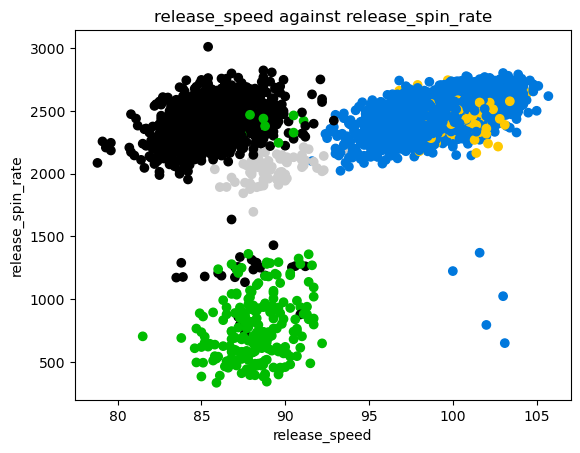

{0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 51, 52, 53, 54, 55, 56, 57, 58, 59, 60, 61, 62, 63, 64, 65, 66, 67, 68, 69, 70, 71, 72, 73, 74, 75, 76, 77, 78, 79, 80, 81, 82, 83, 84, 85, 86, 87, 88, 89, 90, 91, 92, 93, 94, 95, 96, 97, 98, 99, 100, 101, 102, 103, 104, 105, 106, 107, 108, 109, 110, 111, 112, 113, 114, 115, 116, 117, 118, 119, 120, 121, 122, 123, 124, 125, 126, -1}


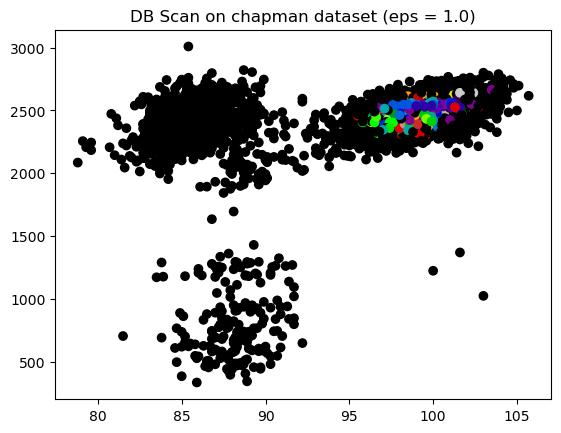

{0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 51, 52, 53, 54, 55, 56, 57, 58, 59, 60, 61, 62, 63, 64, 65, 66, 67, 68, 69, 70, 71, 72, 73, 74, 75, -1}


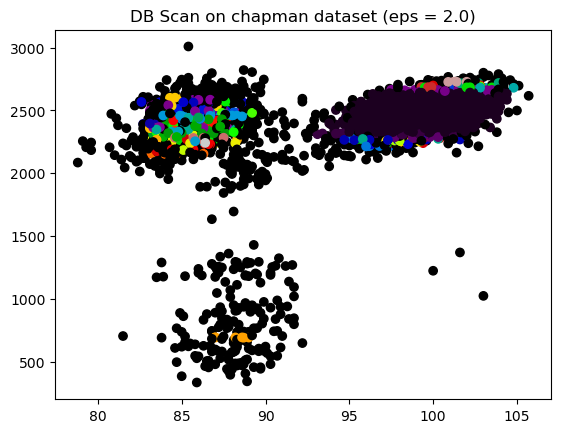

{0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, -1}


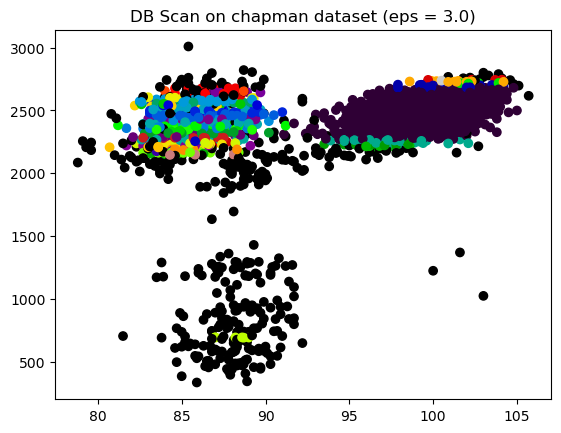

{0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, -1}


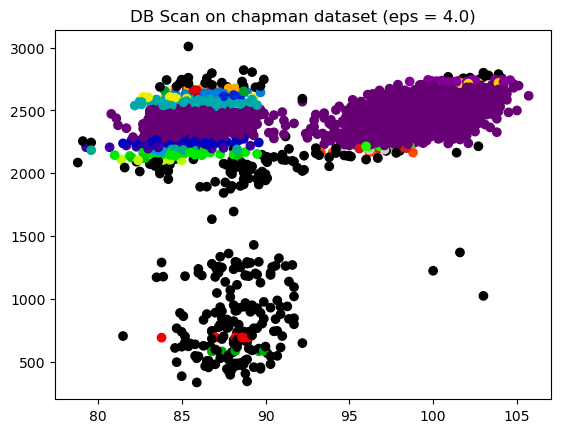

{0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, -1}


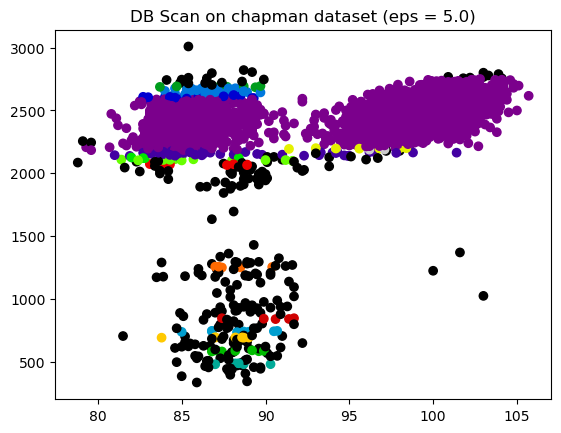

{0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, -1}


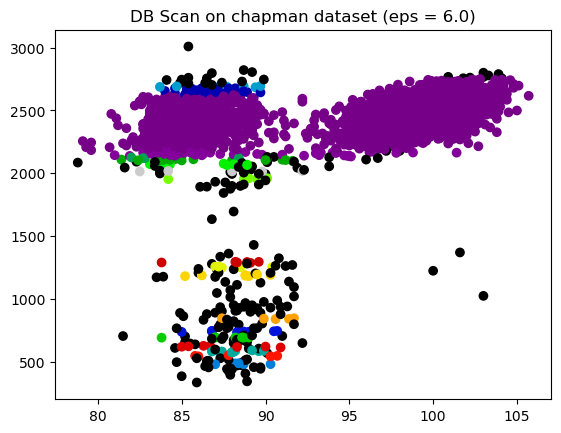

{0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, -1}


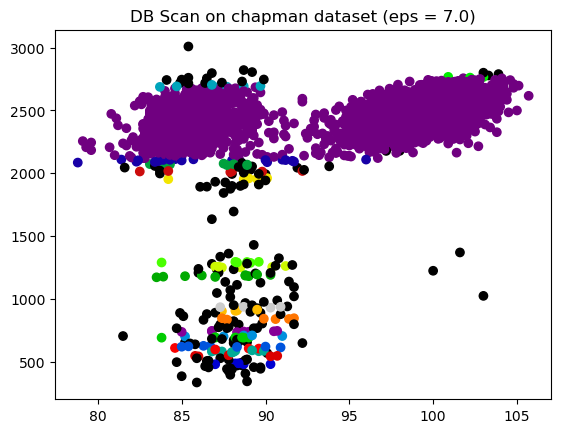

{0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, -1}


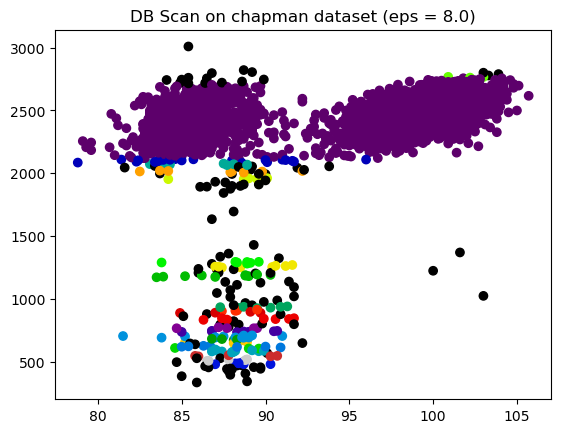

{0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, -1}


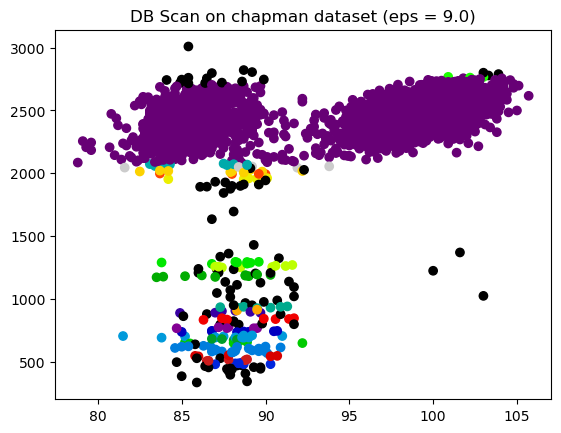

{0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, -1}


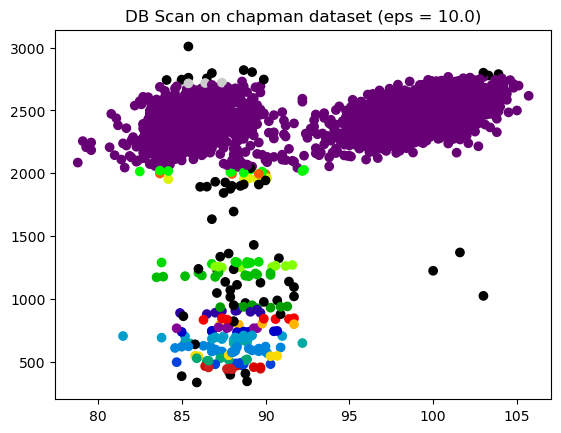

{0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, -1}


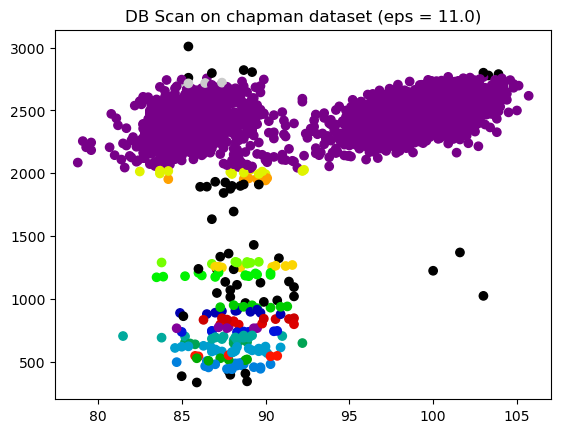

{0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, -1}


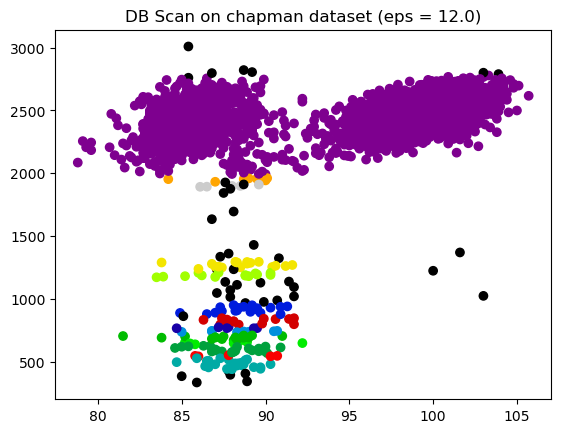

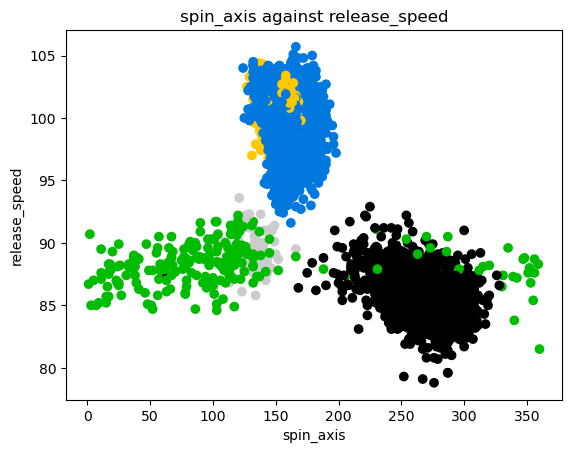

{0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 51, 52, 53, 54, 55, 56, 57, 58, 59, 60, 61, 62, 63, 64, 65, 66, 67, 68, 69, 70, 71, 72, 73, 74, 75, 76, 77, 78, 79, 80, 81, 82, 83, 84, 85, 86, 87, 88, 89, 90, 91, 92, 93, 94, 95, 96, 97, -1}


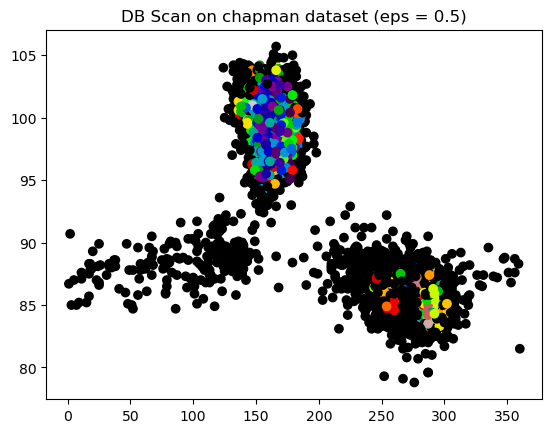

{0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, -1}


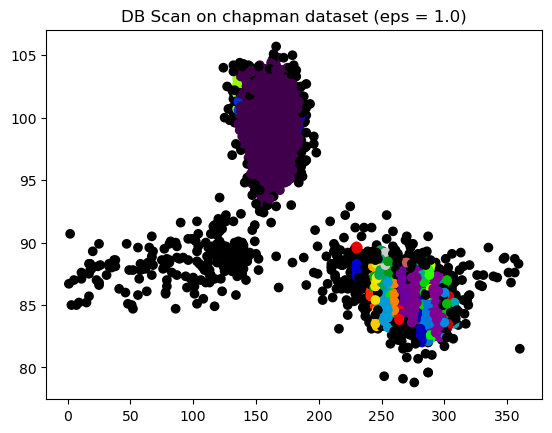

{0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, -1}


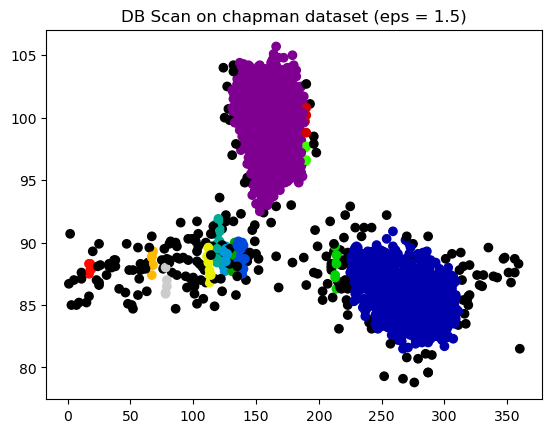

{0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, -1}


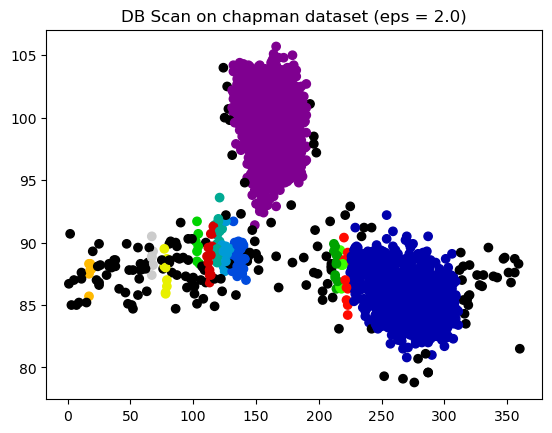

{0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, -1}


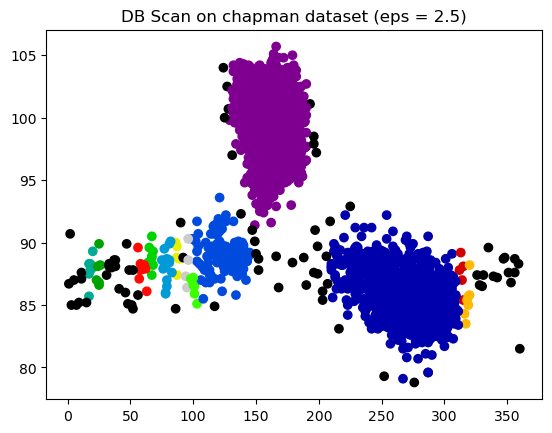

{0, 1, 2, 3, 4, 5, 6, 7, 8, 9, -1}


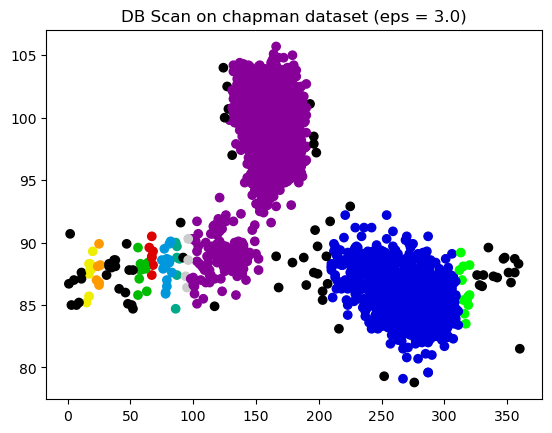

{0, 1, 2, 3, 4, 5, 6, 7, 8, -1}


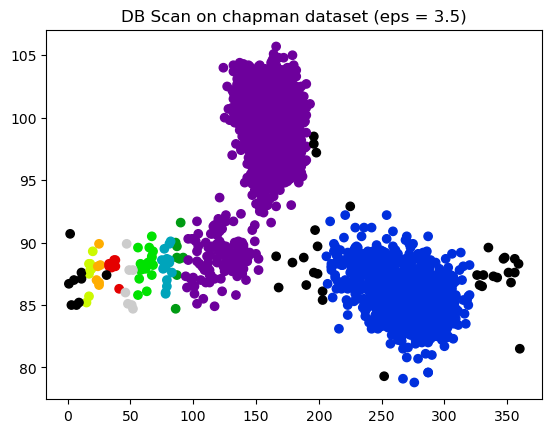

{0, 1, 2, 3, 4, 5, -1}


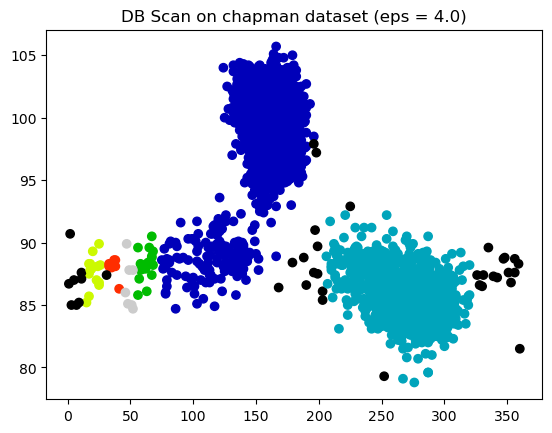

{0, 1, 2, 3, 4, 5, -1}


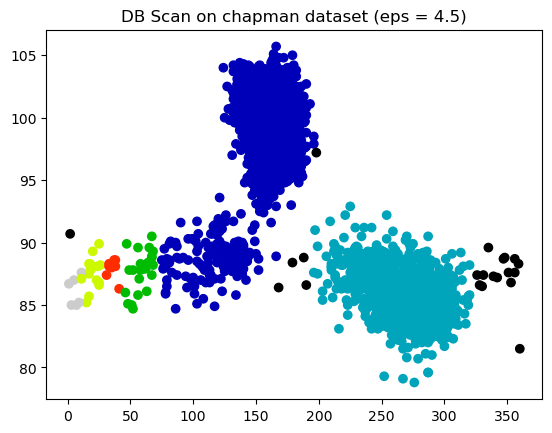

{0, 1, 2, 3, 4, 5, 6, -1}


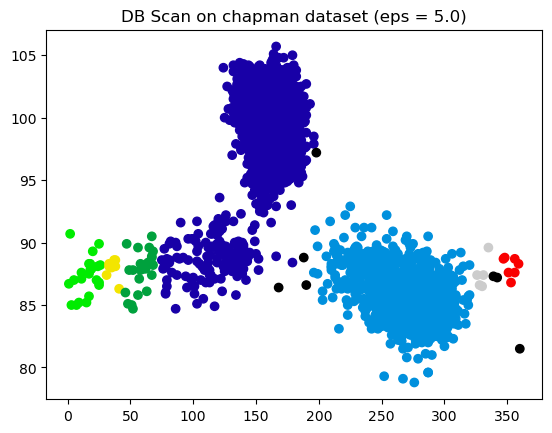

{0, 1, 2, 3, 4, -1}


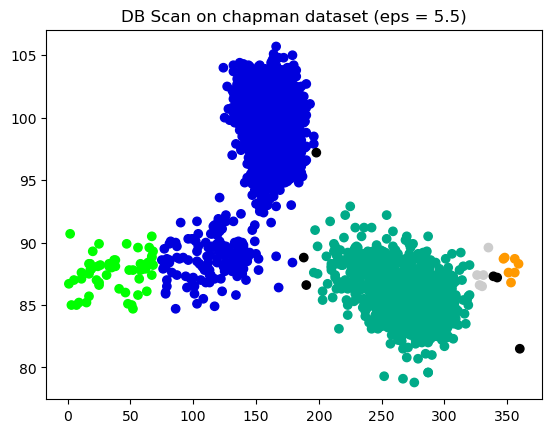

{0, 1, 2, 3, 4, -1}


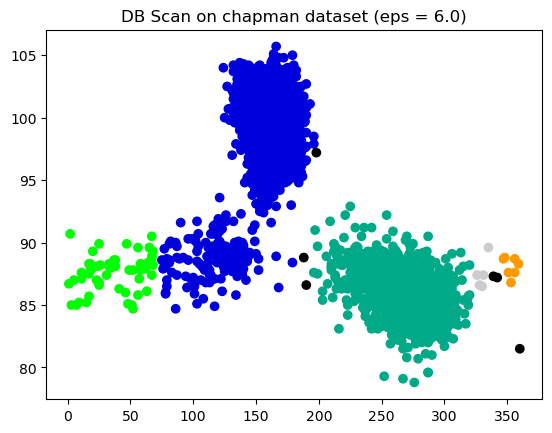

{0, 1, 2, -1}


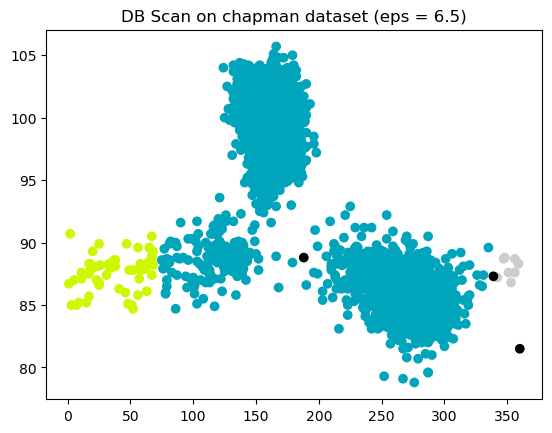

In [44]:
chapman = getPitcherData(547973,[2015,2022])

createPlot(chapman,'release_speed','release_spin_rate')

ctrx2, ctex2, ctry2, cteya2 = getData(chapman,['release_speed','release_spin_rate'],'pitch_type',0.25)
for i in range(10,130,10):
    val = i/10
    model1 = cluster.DBSCAN(eps=val)
    #model1.fit(ctrx2)
    cteyp2 = model1.fit_predict(ctrx2)
    print(set(cteyp2))

    plt.scatter(ctrx2['release_speed'],ctrx2['release_spin_rate'],c=cteyp2,cmap='nipy_spectral')
    plt.title(f'DB Scan on chapman dataset (eps = {val})')
    plt.show()
    
createPlot(chapman,'spin_axis','release_speed')

ctrx2, ctex2, ctry2, cteya2 = getData(chapman,['spin_axis','release_speed'],'pitch_type',0.25)
for i in range(5,70,5):
    val = i/10
    model1 = cluster.DBSCAN(eps=val)
    #model1.fit(ctrx2)
    cteyp2 = model1.fit_predict(ctrx2)
    print(set(cteyp2))

    plt.scatter(ctrx2['spin_axis'],ctrx2['release_speed'],c=cteyp2,cmap='nipy_spectral')
    plt.title(f'DB Scan on chapman dataset (eps = {val})')
    plt.show()


In [39]:
chapman

,pitch_type,game_date,release_speed,release_pos_x,release_pos_z,player_name,batter,pitcher,events,description,...,fld_score,post_away_score,post_home_score,post_bat_score,post_fld_score,if_fielding_alignment,of_fielding_alignment,spin_axis,delta_home_win_exp,delta_run_exp
0,SL,2020-10-09,85.4,0.76,6.07,"Chapman, Aroldis",621563,547973,strikeout,called_strike,...,1,1,2,2,1,Standard,Standard,285.0,-0.007,-0.067
1,SL,2020-10-09,85.7,0.63,6.03,"Chapman, Aroldis",621563,547973,NaN,swinging_strike,...,1,1,2,2,1,Standard,Standard,269.0,0.000,-0.027
2,FF,2020-10-09,97.3,0.63,5.99,"Chapman, Aroldis",621563,547973,NaN,called_strike,...,1,1,2,2,1,Standard,Standard,145.0,0.000,-0.017
3,FF,2020-10-09,98.2,0.48,5.97,"Chapman, Aroldis",650490,547973,field_out,hit_into_play,...,1,1,2,2,1,Standard,Standard,154.0,-0.009,-0.234
4,FF,2020-10-09,97.6,0.63,5.94,"Chapman, Aroldis",650490,547973,NaN,ball,...,1,1,2,2,1,Standard,Standard,146.0,0.000,0.040
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1730,SL,2021-04-05,85.4,0.59,6.35,"Chapman, Aroldis",663624,547973,strikeout,swinging_strike,...,7,0,7,0,7,Standard,Standard,203.0,0.001,-0.174
1731,SL,2021-04-05,84.4,0.44,6.40,"Chapman, Aroldis",663624,547973,NaN,foul,...,7,0,7,0,7,Standard,Standard,307.0,0.000,0.000
1732,FF,2021-04-05,100.2,0.60,6.24,"Chapman, Aroldis",663624,547973,NaN,ball,...,7,0,7,0,7,Standard,Standard,156.0,0.000,0.022
1733,FF,2021-04-05,98.1,0.72,6.27,"Chapman, Aroldis",663624,547973,NaN,foul_tip,...,7,0,7,0,7,Standard,Standard,159.0,0.000,-0.052


*The Chapman dataset in question*

We can further modify the Chapman dataset by only looking at pitches from one season - in this case, 2017. We will test with the same epsilon values with a smaller dataset to see if DB Scan is better at clustering.

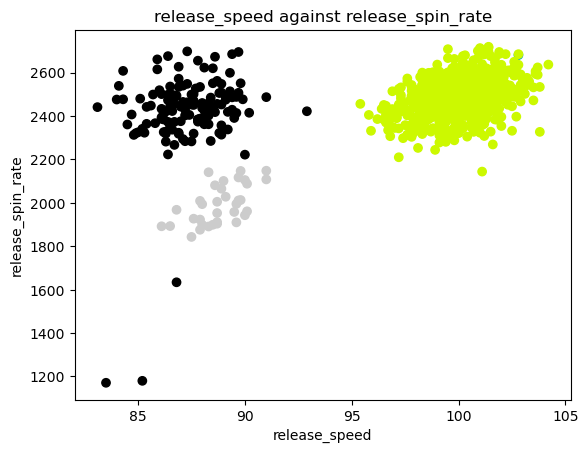

{0, 1, 2, 3, -1}


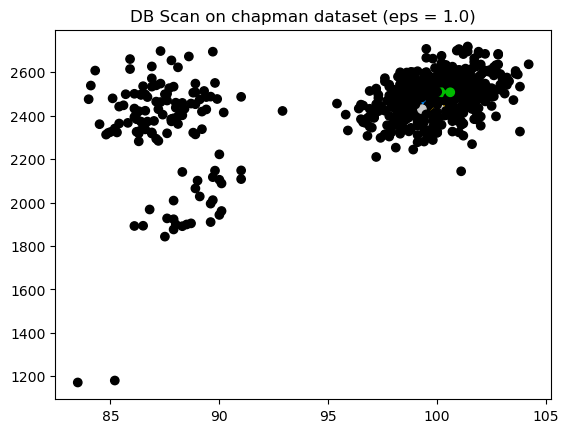

{0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, -1}


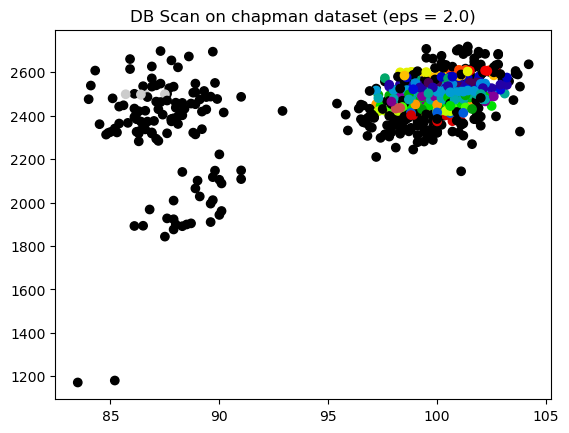

{0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, -1}


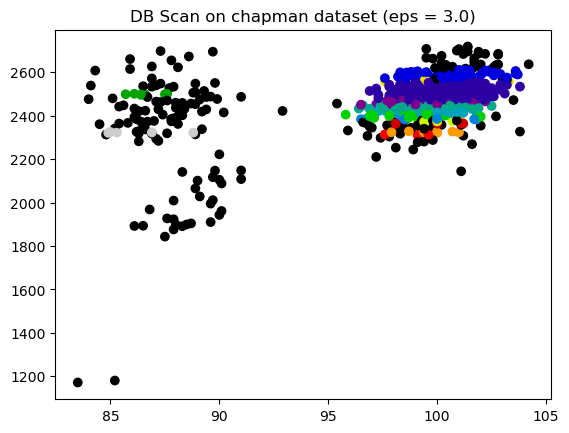

{0, 1, 2, 3, 4, 5, 6, 7, 8, -1}


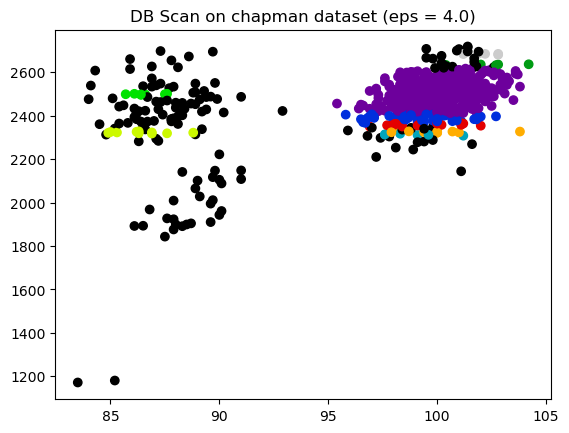

{0, 1, 2, 3, 4, 5, 6, 7, 8, -1}


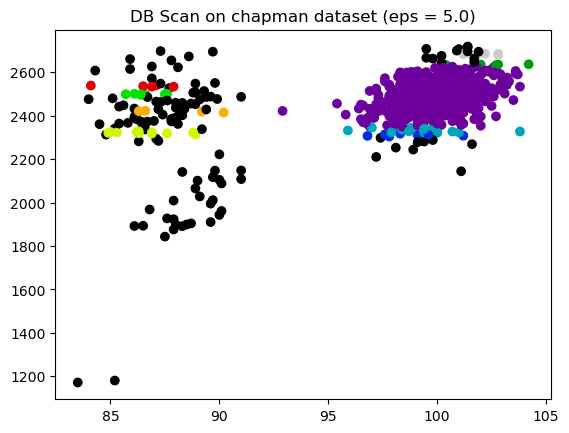

{0, 1, 2, 3, 4, 5, 6, -1}


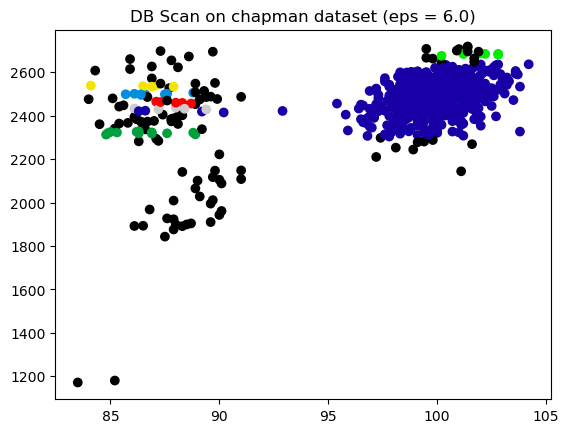

{0, 1, 2, 3, 4, 5, 6, 7, 8, -1}


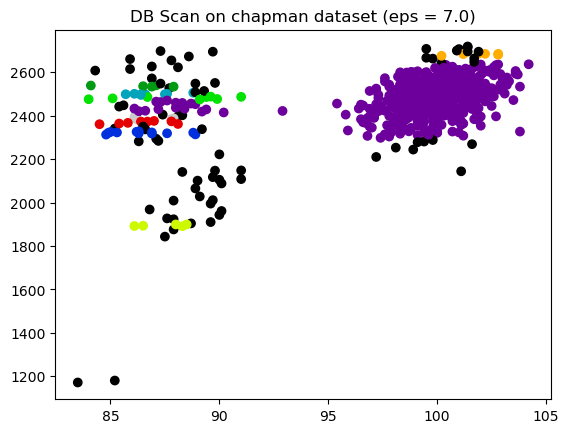

{0, 1, 2, 3, 4, 5, 6, 7, -1}


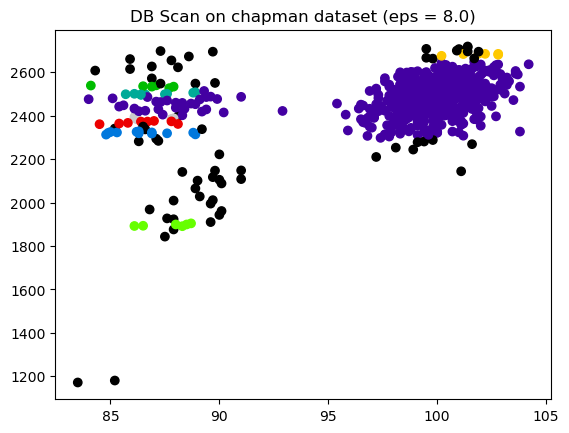

{0, 1, 2, 3, 4, -1}


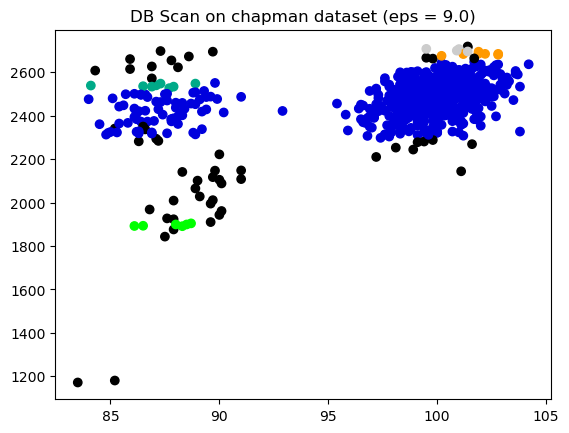

{0, 1, 2, 3, -1}


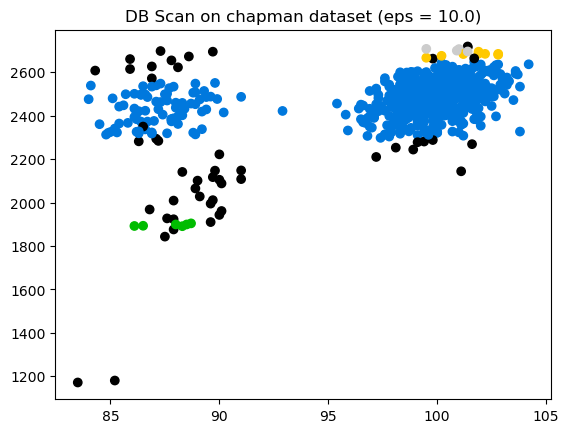

{0, 1, 2, -1}


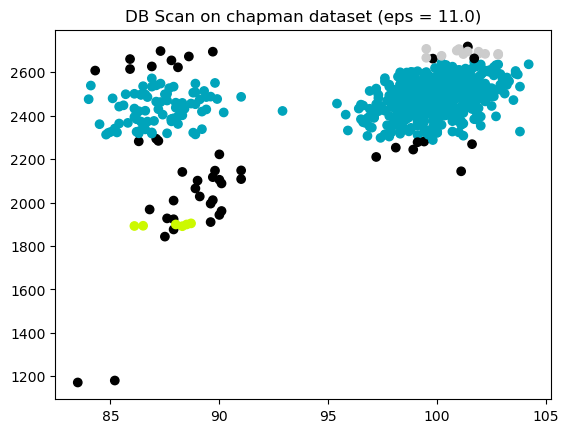

{0, 1, 2, -1}


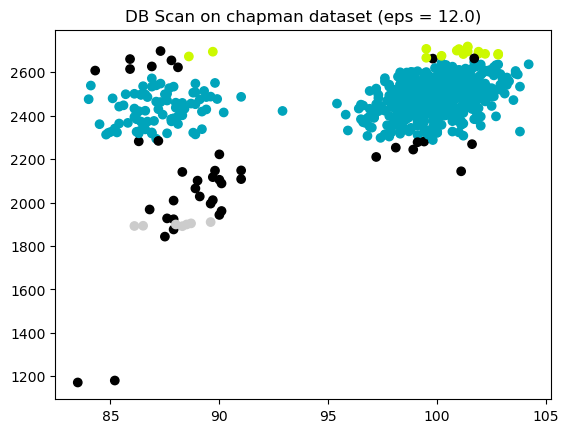

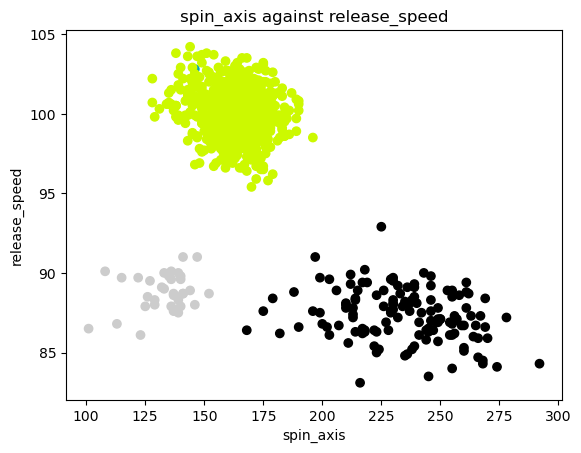

{0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, -1}


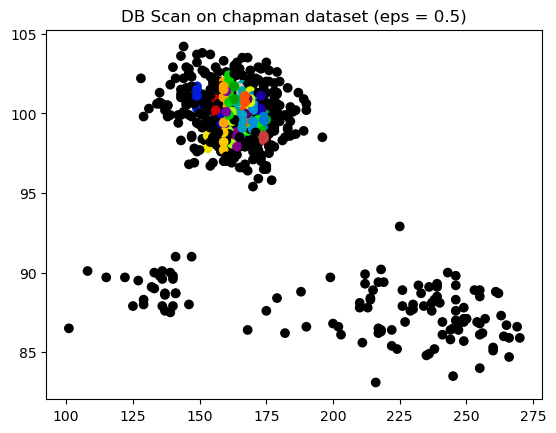

{0, 1, 2, 3, 4, 5, 6, -1}


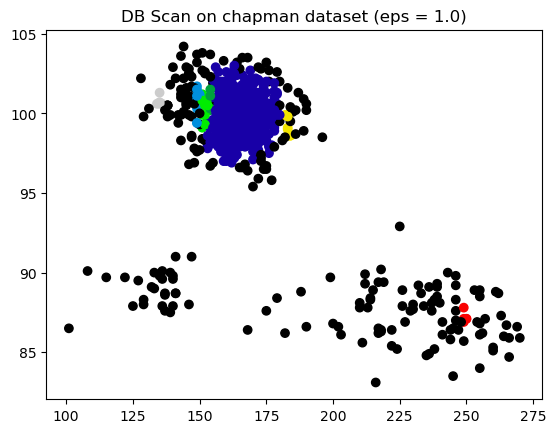

{0, 1, 2, 3, 4, 5, 6, 7, 8, -1}


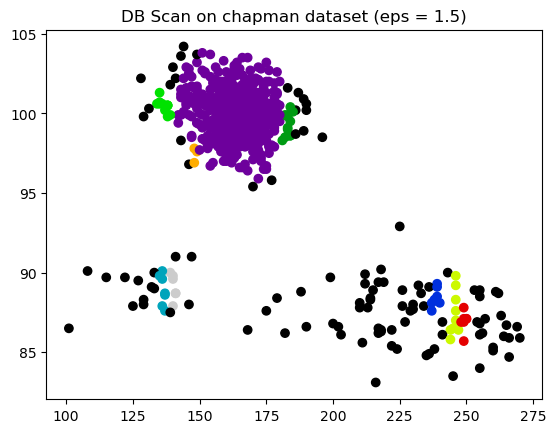

{0, 1, 2, 3, 4, 5, 6, 7, -1}


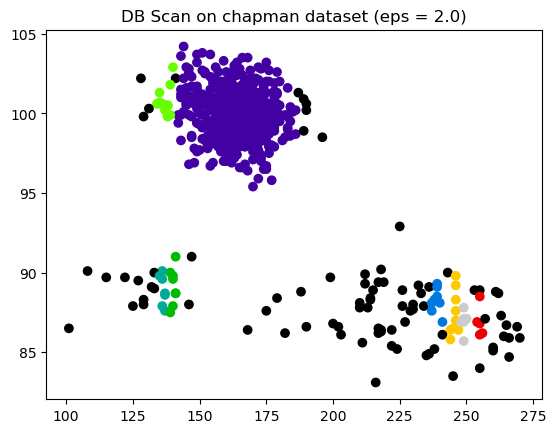

{0, 1, 2, 3, 4, 5, 6, 7, 8, -1}


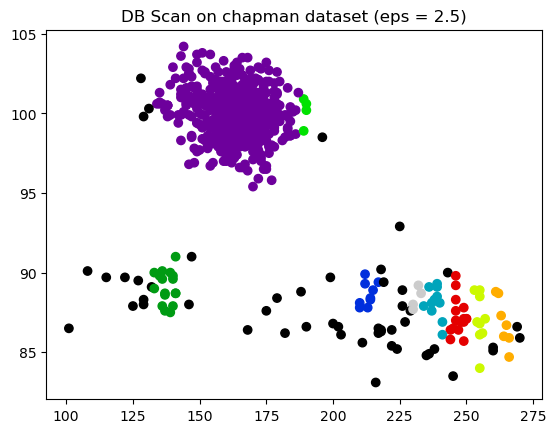

{0, 1, 2, 3, 4, 5, 6, 7, -1}


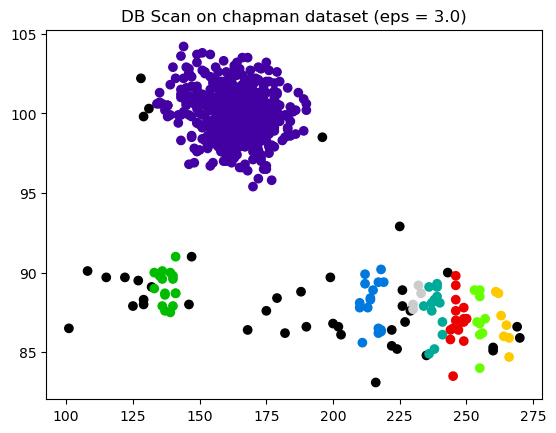

{0, 1, 2, 3, 4, -1}


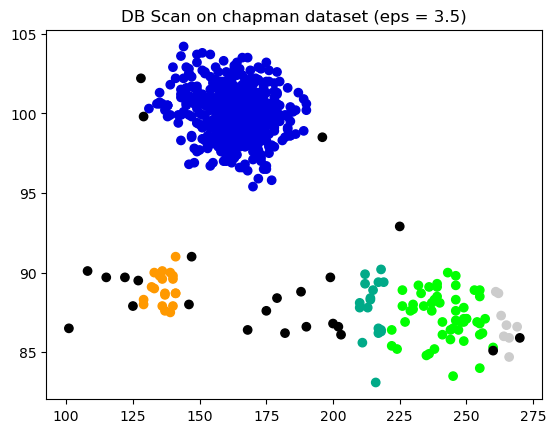

{0, 1, 2, 3, -1}


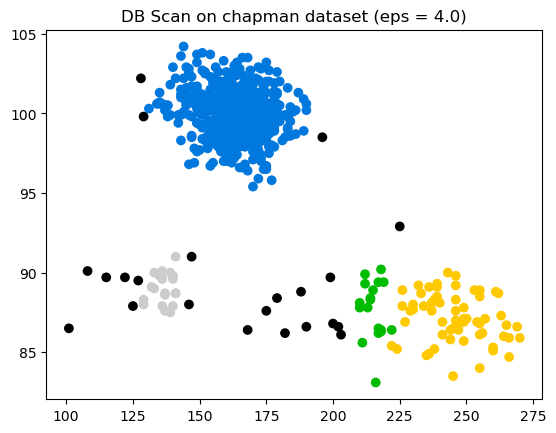

{0, 1, 2, -1}


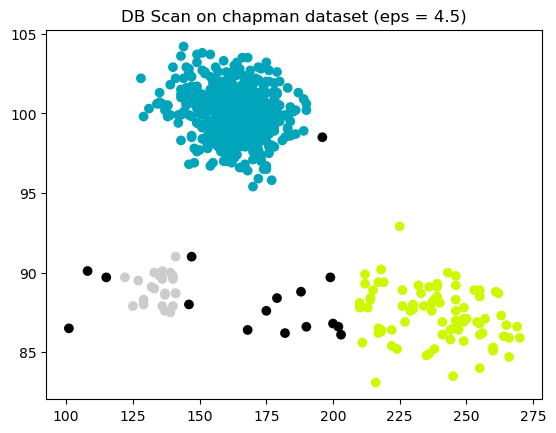

{0, 1, 2, -1}


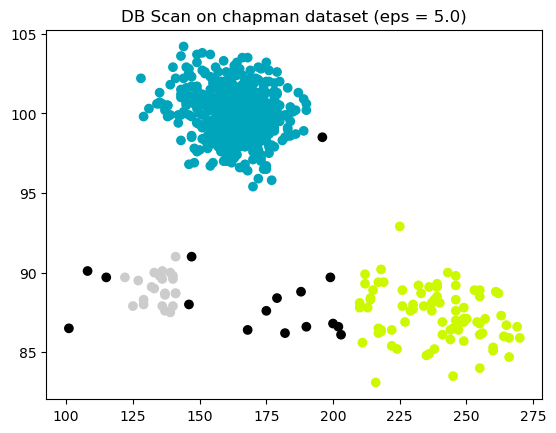

{0, 1, 2, -1}


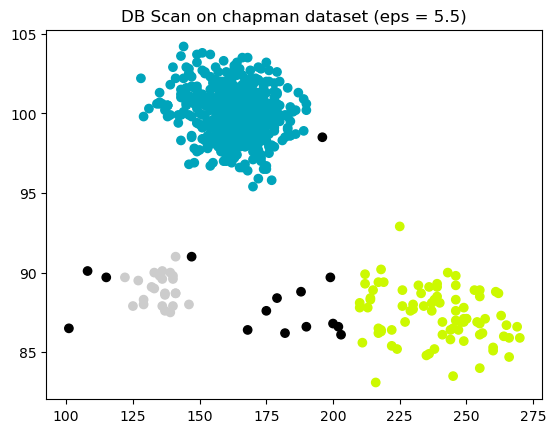

{0, 1, -1}


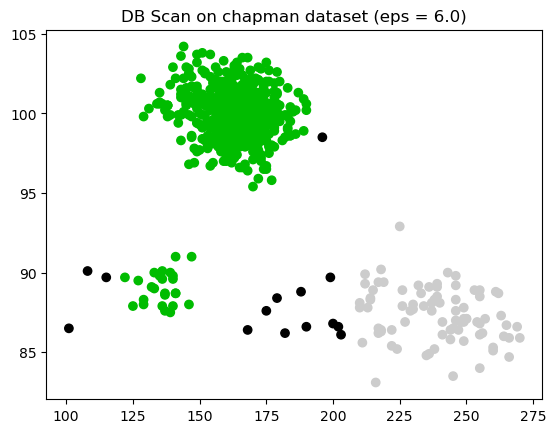

{0, 1, -1}


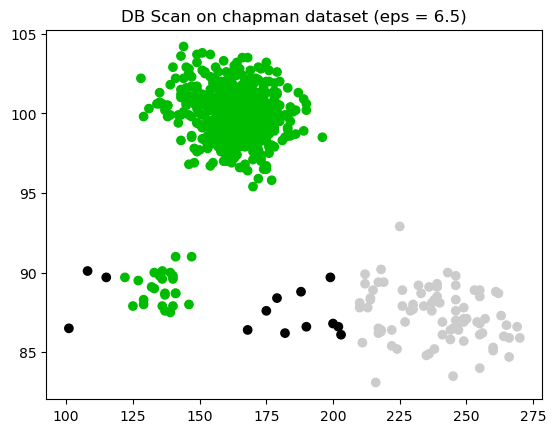

In [43]:
chapman = getPitcherData(547973,2017)

createPlot(chapman,'release_speed','release_spin_rate')

ctrx2, ctex2, ctry2, cteya2 = getData(chapman,['release_speed','release_spin_rate'],'pitch_type',0.25)
for i in range(10,130,10):
    val = i/10
    model1 = cluster.DBSCAN(eps=val)
    #model1.fit(ctrx2)
    cteyp2 = model1.fit_predict(ctrx2)
    print(set(cteyp2))

    plt.scatter(ctrx2['release_speed'],ctrx2['release_spin_rate'],c=cteyp2,cmap='nipy_spectral')
    plt.title(f'DB Scan on chapman dataset (eps = {val})')
    plt.show()
    
createPlot(chapman,'spin_axis','release_speed')

ctrx2, ctex2, ctry2, cteya2 = getData(chapman,['spin_axis','release_speed'],'pitch_type',0.25)
for i in range(5,70,5):
    val = i/10
    model1 = cluster.DBSCAN(eps=val)
    #model1.fit(ctrx2)
    cteyp2 = model1.fit_predict(ctrx2)
    print(set(cteyp2))

    plt.scatter(ctrx2['spin_axis'],ctrx2['release_speed'],c=cteyp2,cmap='nipy_spectral')
    plt.title(f'DB Scan on chapman dataset (eps = {val})')
    plt.show()

DB Scan worked very well clustering the pitches when using speed and spin axis, using epsilon values around 5. The clusters predicted are separate from each other, with few outliers.

In [41]:
chapman

,pitch_type,game_date,release_speed,release_pos_x,release_pos_z,player_name,batter,pitcher,events,description,...,fld_score,post_away_score,post_home_score,post_bat_score,post_fld_score,if_fielding_alignment,of_fielding_alignment,spin_axis,delta_home_win_exp,delta_run_exp
0,FF,2017-10-17,100.9,0.99,6.18,"Chapman, Aroldis",594828,547973,field_out,hit_into_play,...,6,4,6,4,6,Standard,Standard,166.0,0.011,-0.106
1,SL,2017-10-17,87.8,0.75,6.33,"Chapman, Aroldis",608324,547973,strikeout,swinging_strike_blocked,...,6,4,6,4,6,Standard,Standard,249.0,0.023,-0.122
2,FF,2017-10-17,101.0,1.03,6.14,"Chapman, Aroldis",608324,547973,NaN,foul,...,6,4,6,4,6,Standard,Standard,146.0,0.000,0.000
3,CH,2017-10-17,90.1,1.12,5.85,"Chapman, Aroldis",608324,547973,NaN,ball,...,6,4,6,4,6,Standard,Standard,136.0,0.000,0.015
4,SL,2017-10-17,87.1,0.96,6.31,"Chapman, Aroldis",608324,547973,NaN,foul,...,6,4,6,4,6,Standard,Standard,257.0,0.000,-0.039
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1000,FF,2017-04-04,97.0,1.25,6.16,"Chapman, Aroldis",519083,547973,field_out,hit_into_play,...,5,5,0,0,5,Standard,Standard,173.0,-0.002,-0.244
1001,FF,2017-04-04,98.1,1.23,6.34,"Chapman, Aroldis",519083,547973,NaN,ball,...,5,5,0,0,5,NaN,NaN,170.0,0.000,0.046
1002,FF,2017-04-04,99.1,1.33,6.37,"Chapman, Aroldis",519083,547973,NaN,ball,...,5,5,0,0,5,Standard,Standard,173.0,0.000,0.026
1004,CH,2017-04-04,86.8,1.08,5.97,"Chapman, Aroldis",543543,547973,NaN,foul,...,5,5,0,0,5,Standard,Standard,113.0,0.000,0.000
